# Assignment 3: Construction of a predictive model using Spark Structured Streaming and textual data (Hacker News)

## 1. Construction of a data set using the provided stream

In [1]:
import threading

# Helper thread to avoid the Spark StreamingContext from blocking Jupyter
        
class StreamingThread(threading.Thread):
    def __init__(self, ssc):
        super().__init__()
        self.ssc = ssc
    def run(self):
        self.ssc.start()
        self.ssc.awaitTermination()
    def stop(self):
        print('----- Stopping... this may take a few seconds -----')
        self.ssc.stop(stopSparkContext=False, stopGraceFully=True)

In [2]:
sc

<SparkContext master=local[*] appName=PySparkShell>

In [3]:
spark

In [4]:
socketDF = spark.readStream.format("socket").option("host", "seppe.net").option("port", 7778).load()
socketDF.printSchema()

root
 |-- value: string (nullable = true)



In [5]:
from pyspark.sql.functions import from_json, schema_of_json

In [6]:
def process_row(df, epoch_id):
    print(epoch_id)
    if df.count() == 0: return
    schema = schema_of_json(df.first().value)
    df_cols = df.selectExpr('CAST(value AS STRING)')\
        .select(from_json('value', schema)\
        .alias('temp'))\
        .select('temp.*')
    df_cols.show()
    # We can also save here using something such as:
    df.write.format("json").mode("append").save("data")

In [7]:
query = socketDF.writeStream.trigger(processingTime='5 seconds').foreachBatch(process_row).start()  

0
1
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|     aid|comments|        domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|     user|votes|
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|40297748|       7|  newatlas.com|     true|2024-05-08 13:13:22|'Underwater bicyc...|'Underwater bicyc...|'Underwater bicyc...|https://newatlas....| peutetre|   19|
|40297763|       0|     wired.com|    false|2024-05-08 13:14:24|Technology Is Tra...|Technology Is Tra...|Technology Is Tra...|https://www.wired...|  MrJagil|    1|
|40297794|       0|microarch.club|    false|2024-05-08 13:17:54|111: Kay Li | Mic...|111: Kay Li | Mic...|Kay Li, Co-Founde...|https://microarch...|hasheddan|    1|
+-----

10
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|   user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|40297946|       3|github.com/google...|     true|2024-05-08 13:34:34|GitHub - google-r...|GitHub - google-r...|TimesFM (Time Ser...|https://github.co...|yeldarb|   24|
|40297958|       0|         youtube.com|    false|2024-05-08 13:35:57|Sandy's take on t...|Sandy's take on t...|Sandy Munro's hig...|https://www.youtu...|  cs702|    1|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+-------------------

19
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|     aid|comments|         domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|        user|votes|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|40298152|       2|     antonz.org|     true|2024-05-08 13:54:32|Modern SQLite: Ge...|Modern SQLite: Ge...|Modern SQLite: Ge...|https://antonz.or...|todsacerdoti|    3|
|40298174|       0|alvaroduran.com|    false|2024-05-08 13:56:36|A Problem-First A...|A Problem-First A...|A Problem-First A...|https://news.alva...|     ohduran|    2|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---

28
+--------+--------+-----------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|     aid|comments|           domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|        user|votes|
+--------+--------+-----------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|40298365|       0|home-assistant.io|    false|2024-05-08 14:15:12|Z-Wave is not dea...|  Z-Wave is not dead|  Z-Wave is not dead|https://www.home-...|     balloob|    2|
|40298370|       0| robinmalfait.com|    false|2024-05-08 14:16:04|Natural sorting o...|Natural sorting o...|Natural sorting o...|https://robinmalf...|charlieirish|    1|
+--------+--------+-----------------+---------+-------------------+--------------------+--------------------+--------------------+------------

37
+--------+--------+------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|     aid|comments|      domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|     user|votes|
+--------+--------+------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|40298486|       2|theverge.com|     true|2024-05-08 14:26:19|Tesla is being in...|Tesla is being in...|Tesla is being in...|https://www.theve...|chollida1|   19|
+--------+--------+------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+

38
+--------+--------+-------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|     aid|com

47
+--------+--------+------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|     aid|comments|            domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|    user|votes|
+--------+--------+------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|40298582|       0|     secondbest.ca|    false|2024-05-08 14:36:17|Ninety-five these...|Ninety-five these...|Ninety-Five These...|https://www.secon...|kmdupree|    1|
|40298593|       0|  about.gitlab.com|    false|2024-05-08 14:36:42|Debug Web apps qu...|Debug Web apps qu...|Debug web apps qu...|https://about.git...|   thedg|    2|
|40298600|       0|danielgolliher.com|    false|2024-05-08 14:37:35|Personal Computin...|  Personal Computing|AI and Replit ena...|https://blog.dani...|jseli

56
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-----------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|       user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-----------+-----+
|40298794|       0|             bbc.com|    false|2024-05-08 14:57:18|US revokes licenc...|US revokes licenc...|US revokes licenc...|https://www.bbc.c...|onemoresoop|    1|
|40298797|       0|twitter.com/mr_ja...|    false|2024-05-08 14:57:30|X\n\nDon’t miss w...|                   X|Apple's New "Crus...|https://twitter.c...|       tosh|    3|
|40298799|       0|          phospho.ai|    false|2024-05-08 14:57:36|Multimodal LLM - ...|Multimodal LLM - ...|Uncensored LLM vi...

65
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|         user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------------+-----+
|40298995|       0|         youtube.com|    false|2024-05-08 15:12:22|Netlify and Next....|Netlify and Next....|Netlify and Next....|https://www.youtu...|ThomasDoesDev|    1|
|40299023|       0|phoenixframework.org|    false|2024-05-08 15:13:59|Phoenix LiveView ...|Phoenix LiveView ...|Phoenix LiveView ...|https://phoenixfr...|   aloukissas|    4|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+----------

75
+--------+--------+-------------+---------+-------------------+--------------------+------------------+--------------------+--------------------+---------+-----+
|     aid|comments|       domain|frontpage|          posted_at|         source_text|      source_title|               title|                 url|     user|votes|
+--------+--------+-------------+---------+-------------------+--------------------+------------------+--------------------+--------------------+---------+-----+
|40299187|       0|  jamesg.blog|    false|2024-05-08 15:26:44|Imperfect program...|Imperfect programs|  Imperfect Programs|https://jamesg.bl...|zerojames|    1|
|40299192|       0|bloomberg.com|    false|2024-05-08 15:27:04|Bloomberg - Are y...|         Bloomberg|OpenAI Is Readyin...|https://www.bloom...|     tosh|    2|
+--------+--------+-------------+---------+-------------------+--------------------+------------------+--------------------+--------------------+---------+-----+

76
+--------+--------+--

84
+--------+--------+-------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|     aid|comments|             domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|        user|votes|
+--------+--------+-------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|40299324|       0|dma-neves.github.io|     true|2024-05-08 15:37:37|DMA\n\n# Raptor -...|                 DMA|Raptor – A High L...|https://dma-neves...|todsacerdoti|    4|
|40299326|       0|     climeworks.com|    false|2024-05-08 15:37:50|Climeworks switch...|Climeworks switch...|Climeworks switch...|https://climework...| toomuchtodo|    2|
+--------+--------+-------------------+---------+-------------------+--------------------+--------------------+--------------------+

93
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|     aid|comments|        domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|    user|votes|
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|40299516|       0|techxplore.com|    false|2024-05-08 15:51:18|Scientists determ...|Scientists determ...|Scientists determ...|https://techxplor...|Jimmc414|    1|
|40299528|       0|      ieee.org|    false|2024-05-08 15:51:53|Request Rejected\...|    Request Rejected|The Roadmap to 6G...|https://ieeexplor...|  mycall|    1|
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+

94
+--------

103
+--------+--------+--------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|     aid|comments|  domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|   user|votes|
+--------+--------+--------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|40299681|       0|phys.org|     true|2024-05-08 16:06:42|Computer models s...|Computer models s...|Computer models s...|https://phys.org/...|rbanffy|    4|
+--------+--------+--------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+

104
+--------+--------+----------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|     aid|comments|    domain|frontpage|    

112
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|     aid|comments|         domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|   user|votes|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|40299813|       3|telegraph.co.uk|    false|2024-05-08 16:18:19|Milei is already ...|Milei is already ...|Milei is already ...|https://www.teleg...|bilsbie|    3|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+

113
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------------+-----+
| 

121
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|        user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|40300023|      11|       pitchfork.com|     true|2024-05-08 16:33:23|Steve Albini, Sto...|Steve Albini, Sto...|Steve Albini, Sto...|https://pitchfork...|  coloneltcb|   54|
|40300027|       2|twitter.com/tim_cook|     true|2024-05-08 16:33:38|X\n\nDon’t miss w...|                   X|Mostly negative r...|https://twitter.c...|stephc_int13|    9|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------

130
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|      user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|40300256|       0|        theverge.com|     true|2024-05-08 16:52:05|The world’s large...|The world’s large...|The largest carbo...|https://www.theve...|      rntn|    4|
|40300303|       0|github.com/mrryan...|    false|2024-05-08 16:56:26|GitHub - mrryanjo...|GitHub - mrryanjo...|CLIPSockets: Clip...|https://github.co...|      ryjo|    1|
|40300312|       0|          la6nca.net|    false|2024-05-08 16:57:05|LA6NCA TUBE TESTE...|  LA6NCA TUBE TESTER|Super small spy t...|htt

139
+--------+--------+---------+---------+-------------------+--------------------+------------+--------------------+--------------------+--------+-----+
|     aid|comments|   domain|frontpage|          posted_at|         source_text|source_title|               title|                 url|    user|votes|
+--------+--------+---------+---------+-------------------+--------------------+------------+--------------------+--------------------+--------+-----+
|40300508|       0|refuel.ai|    false|2024-05-08 17:13:07|# Refuel-LLM Play...|        NULL|Show HN: RefuelLL...|https://labs.refu...|i-am-agi|    3|
+--------+--------+---------+---------+-------------------+--------------------+------------+--------------------+--------------------+--------+-----+

140
+--------+--------+--------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|     aid|comments|  domain|frontpage|          posted_at|         source_tex

149
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|     aid|comments|         domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|      user|votes|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|40300868|       0|    semafor.com|    false|2024-05-08 17:39:07|Researchers warne...|Researchers warne...|Researchers warne...|https://www.semaf...|  jmsflknr|    1|
|40300899|       7|     kotaku.com|    false|2024-05-08 17:42:00|Apple’s New iPad ...|Apple’s New iPad ...|Apple's New iPad ...|https://kotaku.co...| asteroidz|    7|
|40300908|       0|theguardian.com|    false|2024-05-08 17:42:36|‘Hopeless and bro...|‘Hopeless and bro...|They are terrifie...|https://www.thegu...|Brajeshwar| 

157
+--------+--------+-----------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------------+-----+
|     aid|comments|     domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|           user|votes|
+--------+--------+-----------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------------+-----+
|40301066|       0|danfrank.ca|    false|2024-05-08 17:56:56|My favourite Jose...|My favourite Jose...|Curated list of t...|https://danfrank....|danielmichaelyc|    3|
|40301080|       0|  remix.run|    false|2024-05-08 17:58:18|Remix - Build Bet...|Remix - Build Bet...|OSS framework for...|  https://remix.run/|      noashavit|    2|
+--------+--------+-----------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-----------

166
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|     aid|comments|         domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|   user|votes|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+
|40301343|       0|theregister.com|    false|2024-05-08 18:21:10|Stack Overflow an...|Stack Overflow an...|Dear Stack Overfl...|https://www.there...|redbell|    1|
+--------+--------+---------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+-------+-----+

167
+--------+--------+------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+

175
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|     aid|comments|        domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|     user|votes|
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+
|40301486|       0|ionatomics.org|    false|2024-05-08 18:37:07|Relative Path Fil...|Relative Path Fil...|Relative Path Fil...|https://blog.iona...|atomicion|    1|
+--------+--------+--------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------+-----+

176
+--------+--------+-------------+---------+-------------------+--------------------+------------+-----------+--------------------+-------+-----+
|     aid|comments|  

184
+--------+--------+-------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------------+-----+
|     aid|comments| domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|           user|votes|
+--------+--------+-------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------------+-----+
|40301633|       0|kde.org|    false|2024-05-08 18:52:33|KDE Human Interfa...|KDE Human Interfa...|KDE Human Interfa...|https://develop.k...|timetraveller26|    2|
+--------+--------+-------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+---------------+-----+

185
+--------+--------+-----------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|     aid|

194
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|        user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------------+-----+
|40301860|       0|       anthropic.com|    false|2024-05-08 19:17:19|Claude’s Constitu...|Claude’s Constitu...|Claude's Constitu...|https://www.anthr...|  thesephist|    2|
|40301868|       0|foundation.mozill...|     true|2024-05-08 19:18:04|Just a moment...\...|    Just a moment...|Meta to kill cruc...|https://foundatio...|Tijdreiziger|    4|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------

203
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|     aid|comments|              domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|    user|votes|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+--------+-----+
|40302005|       0|twitter.com/realg...|    false|2024-05-08 19:33:03|X\n\nDon’t miss w...|                   X|The reason the In...|https://twitter.c...| gorwell|   12|
|40302011|       0|     ryanholiday.net|    false|2024-05-08 19:33:57|This is The Accom...|This is The Accom...|"Coaching Tree" I...|https://ryanholid...|jseliger|    1|
+--------+--------+--------------------+---------+-------------------+--------------------+--------------------+--------------------+-------------

In [8]:
query.stop()

205
+--------+--------+------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|     aid|comments|            domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|      user|votes|
+--------+--------+------------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|40302026|       0|        blunix.com|    false|2024-05-08 19:35:37|Disposable Tempor...|Disposable Tempor...|Disposable Tempor...|https://www.bluni...|blunixgmbh|    2|
|40302028|       0|thenewatlantis.com|    false|2024-05-08 19:35:50|If You Build It, ...|If You Build It, ...|Austin's intersta...|https://www.thene...|  jseliger|    3|
+--------+--------+------------------+---------+-------------------+--------------------+--------------------+--------------------+---------------

The historical data that was collected through the provided stream represents JSON dictionaries containing the following 11 variables:
- id
- title
- url
- domain (i.e., the website where a given article is published)
- votes
- user
- posted_at (in the format "yyyy-mm-dd hh:mm:ss)
- comments
- source_title
- source_text
- frontpage (i.e. our target)

In [9]:
#Reading the directory of the saved text files into a Spark DataFrame
import pandas as pd
import json
path_to_json = ["C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (29.04.2024)", 
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (30.04.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (30.04.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (01.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (01.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (02.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (02.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (03.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (03.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (04.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (04.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (05.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (05.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (06.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (06.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (07.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (07.05.2024) - 2",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (08.05.2024) - 1",
                "C:/Users/HP/Downloads/spark/spark/notebooks/data (train)/data (08.05.2024) - 2"]

pandas_dataframe = pd.DataFrame()
for j in path_to_json:
    for file_name in [file for file in os.listdir(j) if file.endswith('.json')]:
      with open(j + "/" + file_name) as json_file:
        data = json.load(json_file)
        result = json.loads(data["value"]) #converting string to dictionary
        pd_dataframe = pd.DataFrame.from_dict(result, orient = "index").transpose() #converting dictionary to dataframe
        pandas_dataframe = pd.concat([pandas_dataframe, pd_dataframe], ignore_index=True)
        print(pandas_dataframe)

        aid                                             title  \
0  40192992  A proof that Unix utility sed is Turing complete   

                                                 url        domain votes  \
0  https://catonmat.net/proof-that-sed-is-turing-...  catonmat.net     2   

        user            posted_at comments source_title source_text frontpage  
0  sebmellen  2024-04-28 23:37:49        0         None        \n\n     False  
        aid                                             title  \
0  40192992  A proof that Unix utility sed is Turing complete   
1  40191447                                      Pip Boy 3000   

                                                 url        domain votes  \
0  https://catonmat.net/proof-that-sed-is-turing-...  catonmat.net     2   
1        https://www.youtube.com/watch?v=bYuz6xOAkfc   youtube.com     1   

        user            posted_at comments  source_title  \
0  sebmellen  2024-04-28 23:37:49        0          None   
1   brudger

         aid                                              title  \
0   40192992   A proof that Unix utility sed is Turing complete   
1   40191447                                       Pip Boy 3000   
2   40193037  Recollections of Early Chip Development at Int...   
3   40193159  The History of Non-Secret Encryption (1987) [pdf]   
4   40192566  Sexsomnia: An embarrassing sleep disorder no o...   
5   40191461         Art isn't supposed to make you comfortable   
6   40191636  A Free PHP Webpage View Counter That Ignores S...   
7   40191938  US Homeland Security names AI safety, security...   
8   40192972              Chained ttys for side-by-side reading   
9   40191715  Global debt hasn't been this bad since the Nap...   
10  40192190  Introducing the Ultimate Stand for Apple Visio...   
11  40191313   Chinese Subs May Be Propelled Silently by Lasers   
12  40191825                                            NextDNS   
13  40192932  Cognita: Retrieve Information from Documents w..

         aid                                              title  \
0   40192992   A proof that Unix utility sed is Turing complete   
1   40191447                                       Pip Boy 3000   
2   40193037  Recollections of Early Chip Development at Int...   
3   40193159  The History of Non-Secret Encryption (1987) [pdf]   
4   40192566  Sexsomnia: An embarrassing sleep disorder no o...   
5   40191461         Art isn't supposed to make you comfortable   
6   40191636  A Free PHP Webpage View Counter That Ignores S...   
7   40191938  US Homeland Security names AI safety, security...   
8   40192972              Chained ttys for side-by-side reading   
9   40191715  Global debt hasn't been this bad since the Nap...   
10  40192190  Introducing the Ultimate Stand for Apple Visio...   
11  40191313   Chinese Subs May Be Propelled Silently by Lasers   
12  40191825                                            NextDNS   
13  40192932  Cognita: Retrieve Information from Documents w..

         aid                                              title  \
0   40192992   A proof that Unix utility sed is Turing complete   
1   40191447                                       Pip Boy 3000   
2   40193037  Recollections of Early Chip Development at Int...   
3   40193159  The History of Non-Secret Encryption (1987) [pdf]   
4   40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..       ...                                                ...   
62  40192728  Foreigner's request for help in Tokyo makes us...   
63  40191430  Was unimpressed by bloated NPS calculators onl...   
64  40191494  Consciousness is simple. Simple is hard. AI ca...   
65  40191419  Liquid Death became a billion-dollar beverage ...   
66  40192649  Apophis will swing by Earth at a distance of l...   

                                                  url                 domain  \
0   https://catonmat.net/proof-that-sed-is-turing-...           catonmat.net   
1         https://www.youtube.com/w

         aid                                              title  \
0   40192992   A proof that Unix utility sed is Turing complete   
1   40191447                                       Pip Boy 3000   
2   40193037  Recollections of Early Chip Development at Int...   
3   40193159  The History of Non-Secret Encryption (1987) [pdf]   
4   40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..       ...                                                ...   
89  40191446  The Simplest Thing in the World: Modifing Keym...   
90  40192669       Web-native Unix-like development environment   
91  40193112  Catholic Group Quickly Defrocks AI Priest Fath...   
92  40191607                      Rabbit R1 Discussion (Dave2D)   
93  40191287                     TamaNOTchi – Cute Virtual Pets   

                                                  url            domain votes  \
0   https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net     2   
1         https://www.youtube.com

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
119  40192330  Show HN: Pingr – Bcc people on iMessage with a...   
120  40192922  What Is the Cost per Square Foot of Different ...   
121  40192727                            Quill 2.0 (Text Editor)   
122  40192356  Ontario reveals details of cellphone ban in sc...   
123  40206597                         Unconventional Aggregation   

                                                   url              domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1          https://www.yout

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
145  40205012  The Scientific Method Part 5: Illusions, Delus...   
146  40206035  Zebras Broke Free on a Highway. A Rodeo Clown ...   
147  40205625  iPad used to fire modern weapons in old Ukrain...   
148  40204475  Razer settles with FTC, will return $1.1M to c...   
149  40204452  How I would redesign Copilot Workspace – Austi...   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
168  40204154  ChatGPT’s AI ‘memory’ can remember the prefere...   
169  40205601                          Detoxing from Achievement   
170  40206825                            A few facts about POSIX   
171  40206760    Implementing Your Own Garbage Collector in Java   
172  40205033  Wasabi Wallet-Developer Blocks U.S. Citizens A...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
191  40205520  Criminals and oligarchs in EU's sights with ne...   
192  40205654  Build an AI Voice Assistant Like Siri (Use Ope...   
193  40204447  General Galactic emerges from stealth to make ...   
194  40204388           Reconciling Effective Altruism and E/acc   
195  40205714  Run0 – systemd based alternative to sudo annou...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
215  40205177                  America Lost the Plot with TikTok   
216  40206752                           Why SQLite Uses Bytecode   
217  40204660                                   Origins of Covid   
218  40205017  How to Fund FOSS, Save It from the CRA, and Im...   
219  40206306     How the Lockheed SR-71 Blackbird Works [video]   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
235  40206863                      Pretraining Without Attention   
236  40205353  In the AI Economy, There Will Be Zero Percent ...   
237  40206379  First Time Ever Laser Excitation of an Atomic ...   
238  40204276  Australian government to invest $1B in quantum...   
239  40206140  Google's Inaccurate Attempt to Celebrate Sonic...   

                                                   url             domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1          https://www.youtub

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
261  40204233  Trucks could detect locations to extract game-...   
262  40204256  PowerShell: The object-oriented shell you didn...   
263  40204195  US, Argentina to cooperate, combat illegal Chi...   
264  40205607  Show HN: GPTLint – an OSS standard for LLM-bas...   
265  40206763  Codapi – Interactive code examples for documen...   

                                                   url              domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1          https://www.yout

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
285  40205843     Why so many men in the US have stopped working   
286  40204524  A Not-So-Random Challenge: Deciphering Jonatha...   
287  40206697  Judge0 Sandbox Escape – allows obtaining root ...   
288  40205178                                       Metric Trees   
289  40205024  The U.S. economy's big problem? People forgot ...   

                                                   url               domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          https://www.yo

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
310  40204533           Lnav: A log file viewer for the terminal   
311  40205344                                Columbia Has Fallen   
312  40204090  European Law Enforcement Officials: Encryption...   
313  40213566  Nebula LLM by Symbl.ai Beats Claude 3, GPT-4, ...   
314  40214059  No Dev Team? No Problem: Writing Malware and A...   

                                                   url               domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          https://www.yo

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
334  40213337  Show HN: Add Siri Like Native AI Assistants to...   
335  40215234  Google Security Blog: 'How We Fought Bad Apps ...   
336  40216411  I Tricked ChatGPT into Being My AI Boyfriend. ...   
337  40212837                                  Running Processes   
338  40215286           What Recent Vulnerabilities Mean to Rust   

                                                   url                 domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...           catonmat.net   
1          https://ww

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
360  40217334  Dream-HTML – render HTML, SVG, MathML, Htmx ma...   
361  40216970           Rendering Engine Architecture Conference   
362  40215876  Now Creators Take Charge Using Bunny Stream wi...   
363  40214783  Dave and Buster's to allow customers to bet on...   
364  40214887                      Make Sentences Longer with AI   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
385  40213047  Some psychedelic drug users are stuck with unw...   
386  40215603  Apollo Accused in Lawsuit of Illegal Human Lif...   
387  40213400                        Dear Europe, please wake up   
388  40212880  ASML Patterns First Wafer Using High-NA EUV To...   
389  40214643                         Apollo Had Some Death Bets   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
404  40216283                   Magic Machines for CI/CD Testing   
405  40214403             Microsoft Entra Private Access Preview   
406  40215288  Hong Kong Bitcoin, ether ETFs see tepid tradin...   
407  40214736  Passkey Implementation: Misconceptions, pitfal...   
408  40212993  List-positions: efficient, collaborative list ...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
431  40215633  Benchmarking Benchmark Leakage in Large Langua...   
432  40214839  Finnair pauses some Estonia flights due to GPS...   
433  40213628   Plastic-eating bacteria help waste self-destruct   
434  40215892  Google sued by US artists over AI image generator   
435  40213024     Enzymes open new path to universal donor blood   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
451  40216457  Binance founder Changpeng Zhao sentenced to fo...   
452  40216615  FTC challenges junk patent listings for blockb...   
453  40213985  Long-Range Imaging Lidar with Multiple Denoisi...   
454  40214128  Why and how German judicial intelligence overs...   
455  40217433  AI Knowledge Management Explained: A Guide for...   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
477  40212862                                In the Land of Dune   
478  40215424  Level of Gaussians: Real-Time View Synthesis f...   
479  40216019  Steve Jobs said Silicon Valley needs serendipi...   
480  40217236  How Zuckerberg made the call to release Llama ...   
481  40216163  Tesla still plans to grow the Supercharger net...   

                                                   url                domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1          https://www.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
502  40215616        How to Block Residential Proxies Using Okta   
503  40216706  Go Generics: Use Structs for Generic Arguments...   
504  40214503  YouTube Transcriptions with AI-Generated Summa...   
505  40216710         Backup Strategies for SQLite in Production   
506  40213469        Nestle Formula: Marketing vs. Breastfeeding   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
530  40216289  React 19 Beta: Major Updates to Async Transact...   
531  40213421                     A Framework for Creating Value   
532  40212919  Show HN: We made Trellis – a way to run SQL qu...   
533  40216562           AI Startups Face Financial Reality Check   
534  40213380  Show HN: A free tool (and a paid plugin) to ad...   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
557  40216987  Show HN: A tool that uses GPT-4 and DataForSEO...   
558  40212979     Why don't we talk about minifying CSS anymore?   
559  40215795  Fairytales much older than previously thought,...   
560  40213363  The surprising reason few Americans are gettin...   
561  40212788  Amazon Q Developer: your assistant for the ent...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
584  40215095  Woodworking as an Escape from the Absurdity of...   
585  40213559  Desire for loud car predicted by being a man: ...   
586  40214550  Loan Programs Office Can Support All Stages of...   
587  40217319  Tensions grow as China ramps up global mining ...   
588  40215634  How good is your logic? Put it to the test wit...   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
607  40213396  Screening reveals 'undrugged, yet druggable' p...   
608  40215884                                  APC Meeting Flops   
609  40214304      GPS-jammer affecting aircrafts around Estonia   
610  40212872                    Tech Error: Diversity Not Found   
611  40215467      CZ of Binance sentenced to 4 months in prison   

                                                   url                domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1          https://www.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
632  40216305  R language flaw allows code execution via RDS/...   
633  40214375                     Rails is dead, long live rails   
634  40214326  'Remote Work Cities': A Proposal to Fight Risi...   
635  40217096  Apple banned Delta for years. It's now America...   
636  40216393    Shfl: A random sampler of album recommendations   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
659  40220802         Is overly relying on ChatGPT worrying you?   
660  40219051                     A Web Variant for Applications   
661  40219516                              Discover 200 AI Tools   
662  40219763  Rapidly rising levels of TFA 'forever chemical...   
663  40219655                               My Remote Desk, 2024   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
681  40219413  Time zones strongly influence NBA results, stu...   
682  40219386  Resistance against London tube map commit hist...   
683  40220878              Policy: Care of the Patient with ECMO   
684  40219784  An assassination plot on American soil reveals...   
685  40220900         iOS: A journey in the USB networking stack   

                                                   url              domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1          https://www.yout

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
705  40220722                      Jane Street is big. Like, big   
706  40219528  The problem with forcing people back to the of...   
707  40219798                       Untitled map app says goobye   
708  40220511  I made a would you rather online game for free...   
709  40220894  AWS S3 storage bucket with unlucky name nearly...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
733  40219704                                               SBIR   
734  40219613  India's economy: The good, bad and ugly in six...   
735  40219194                        Rabbit R1 as an Android App   
736  40219785     Unpacking Elixir: IoT and Embedded with Nerves   
737  40220730  "Cuckoo" macOS malware combines infostealer an...   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
757  40219218  Chinese virologist shared Covid-19 data. Now h...   
758  40220569  Tesla is already pulling back Supercharger pla...   
759  40220253                               Beautiful 3D Website   
760  40220289  Show HN: Wanlanid, a new way of self-growth in...   
761  40220950                      MemoKit – Memories with Music   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
777  40219794  Starbucks Shares Plunge After Sales, Earnings ...   
778  40220746  OpenAI's chat history saving now excludes mode...   
779  40219057        A CSS framework for recreating Windows 7 UI   
780  40218981  Next Big Social App – TapIn – Connect with eve...   
781  40220861                    Was I Wrong About Rust? [video]   

                                                   url                domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1          https://www.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
799  40230593  The Anti-Fragile Brendan Eich – Andrew Beck – ...   
800  40229930      YouTube's Legal Team sent me a letter [video]   
801  40230988  Horizontal running inside circular walls of Mo...   
802  40231897  Can genre-buster Edgar Wright breathe new life...   
803  40230531              A Brief History of "Dark Mode" (2020)   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
824  40231148                Minutes Until the End of the World?   
825  40230192  SoccerNet Game State Reconstruction: End-to-En...   
826  40231673                      I made a website: Book Sharer   
827  40228755                         Ornstein–Uhlenbeck Process   
828  40230374  Atlassian ups AI ante with Rovo collaborative ...   

                                                   url            domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1          https://www.youtube.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
848  40231630  ESpeak-ng: speech synthesizer with more than o...   
849  40231557  US cancer patient 'blessed' after $1.3B lotter...   
850  40231369                Top Steam Tags by Sales and Revenue   
851  40229296  Reimagining Balance: How Medieval Insights Alt...   
852  40231611  Cdn.jsdelivr.net unreachable due to expired ce...   

                                                   url                domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1          https://www.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
872  40231621         Taskwarrior – Command Line Task Management   
873  40228444    Show HN: Bathroom App – Find bathrooms near you   
874  40228473                                  Ratchet and Phi 3   
875  40228953                                The Copenhagen Book   
876  40231010  Meteorologists awed by rare type of tornado (a...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
893  40228261                  We Quit Our Jobs to Build a Cabin   
894  40231641  Hacker free-for-all fights for control of home...   
895  40229816  AlabugaLeaks Part 2: Kaspersky Lab & neural ne...   
896  40229448  GLP1 receptor agonists do not up risk for comp...   
897  40229424                  Bard AI vs. ChatGPT Scrabble Game   

                                                   url             domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1          https://www.youtub

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
908  40231196  Whistleblower Josh Dean of Boeing Supplier Spi...   
909  40230259  Unity announces another new CEO: ex-Zynga exec...   
910  40228293                  Curated Coding Interview Handbook   
911  40230569                       'My country would disappear'   
912  40229309  Does Quantum Mechanics Imply Multiple Universe...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
929  40230812  Google's Payments to Apple Reached $20B in 202...   
930  40230598  Microsoft says April Windows updates break VPN...   
931  40230989  Daimler is helping decarbonize logistics with ...   
932  40230533          Show HN: Create math animations from text   
933  40229905  Recent Increments in Incremental View Maintenance   

                                                   url                domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1          https://www.

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
952  40230182     Prompt Routers and Modular Prompt Architecture   
953  40231372  Am radio law opposed by tech and auto industri...   
954  40229305  Show HN: I created a selfhostable steam-like p...   
955  40231617                       How to Pave the Road to Hell   
956  40228940  Trends in Congressional Emails to Constituents...   

                                                   url               domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          https://www.yo

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
971  40229745        I Watched a Guy Eat a Barrel of Cheeseballs   
972  40231515  mRNA Cancer Vaccine Reprograms Immune System t...   
973  40231541  Is hake's remarkable recovery in the Atlantic ...   
974  40230490  NSA Disclosure of U.S. Identities in Surveilla...   
975  40231069  Apple Embraces Emulators. So Can You BaudeJogo...   

                                                   url  \
0    https://catonmat.net/proof-that-sed-is-turing-...   
1          https://www.youtube.com/watch?v=bYuz6xOAkfc   
2    http

          aid                                              title  \
0    40192992   A proof that Unix utility sed is Turing complete   
1    40191447                                       Pip Boy 3000   
2    40193037  Recollections of Early Chip Development at Int...   
3    40193159  The History of Non-Secret Encryption (1987) [pdf]   
4    40192566  Sexsomnia: An embarrassing sleep disorder no o...   
..        ...                                                ...   
992  40230692                                 Understanding UMAP   
993  40229489  Show HN: Extracting structured data from the w...   
994  40231060  Boeing's deliberately defective fleet of flyin...   
995  40229798  Restaurant Surcharges Are Set to Disappear Thi...   
996  40229106  It's Not Just Gaza: Student Protesters See Lin...   

                                                   url                 domain  \
0    https://catonmat.net/proof-that-sed-is-turing-...           catonmat.net   
1          https://ww

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1010  40235338  Deeper Implications of Biden's Title 9 Changes...   
1011  40234913  Elections 2024: Tracking AI use in global elec...   
1012  40236759  A New Battery Warns Parents If Their Child Has...   
1013  40236807  Meteorites in Antarctica Are Getting Harder to...   
1014  40234172  Chance to own a decommissioned US Government s...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1033  40235490                Show HN: AI Drawing Image Generator   
1034  40233907  Private ChatGPT Using Encrypted Anonymization ...   
1035  40235695  Peloton announces new round of layoffs as CEO ...   
1036  40234869  Alarming superbug from deadly eyedrop outbreak...   
1037  40236716  A few observations from a European entrepreneu...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1052  40235432       Learning Go in 2024; from Beginner to Senior   
1053  40234433  Hynix says high-bandwidth memory chips almost ...   
1054  40234398                      Hacking on PostgreSQL Is Hard   
1055  40233947                             The Fallacy of Passion   
1056  40235844  The first-ever driverless car race didn't go s...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1073  40233870  Getir to exit European and US markets, announc...   
1074  40236345  Introduction to the coordinate system and diff...   
1075  40234212  GPS jamming: no more flights to the airport in...   
1076  40235459  Why DOS .exe "MZ executables" can also begin w...   
1077  40233922            An alternative proposal for CSS masonry   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1093  40235761   George Hotz explains tinygrad's approach [video]   
1094  40234045                                  Neovim to VS Code   
1095  40235944  Show HN: Hamilton's UI – observability, lineag...   
1096  40236384  NASA says Artemis II report by its inspector g...   
1097  40236598                                 New Dropbox Breach   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1112  40234580  Show HN: Library for creating nice PHP CLI eas...   
1113  40235040  John Lothropp: Ancestor of 80k people includin...   
1114  40236142        RPKI ROV Deployment Reaches Major Milestone   
1115  40236604  The overfitted brain: Dreams evolved to assist...   
1116  40234047  A million Australian pubgoers personal info li...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1132  40236456             A transformer walk-through, with Gemma   
1133  40234428  Are young people smarter than adults? Research...   
1134  40236601                      The UK Bans Default Passwords   
1135  40236100  Remote machine learning on Windows with Docker...   
1136  40234501  A high-density and high-confinement tokamak pl...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1153  40236351  Nvidia releases ChatQA-1.5 in violation of Lla...   
1154  40234319  Red Bull's Adrian Newey leaves F1 team, shifts...   
1155  40234490        Visiting the most expensive nuclear station   
1156  40235280  Diffoci – diff for Docker and OCI container im...   
1157  40235259  Apple, Google and Venmo fight new U.S. plan to...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1175  40235580         Apple plans AI features for its iPad Event   
1176  40234031                                  J Burden Substack   
1177  40234783  Building a submarine drone and reaching 127m d...   
1178  40235626  AI Code Assistants: The New Outsourcing? Navig...   
1179  40235143  Russian space nuke could render low-Earth orbi...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1195  40235114             America's Booziest and Driest Counties   
1196  40236438  WarGames (WOPR) on real IMSAI 8080 hardware wi...   
1197  40235682  Show HN: Hatch v1.10.0 – UV support, new test ...   
1198  40235031  A 21,565X performance improvement in linting G...   
1199  40235346                              Passwords Are History   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1217  40234881      The SSO tax makes the whole world less secure   
1218  40234228                      Introduction to Vectorization   
1219  40235461  Uber faces £250M lawsuit from London's black-c...   
1220  40233933                           The User Is on Their Own   
1221  40236236  Biden: Xenophobia Stalling Growth in China,Ind...   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1241  40234363  HTTP Fundamentals: Routing fetch() to an in-me...   
1242  40236699  GitHub: Nintendo Submit DMCA Notices to Yuzu F...   
1243  40234681  A Strong Job Market? Try Telling That to These...   
1244  40236062  US extends permission for energy-related trans...   
1245  40236457  P.T. Barnum Brought Beluga Whales to New York ...   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1261  40234313  Harnessing AI for Creative Expressions with VE...   
1262  40235969  Found: The dial in the brain that controls the...   
1263  40235610                            I Left NixOS for Ubuntu   
1264  40234803  A safer alternative for an explosive reaction ...   
1265  40235151  Long-predicted consumer pullback hits Starbuck...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1283  40234557  Nano 8.0 Text Editor Released with Modern Bind...   
1284  40235430  Show HN: Teamlight – Who's who, what they do, ...   
1285  40236414  Johnson and Johnson announces $6.5B settlement...   
1286  40235759  Citizen Scientists Help Discover Habitable Zon...   
1287  40234383  Teranoptia – a typeface that allows you to ima...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1306  40241651   Sends a good AI newsletter on any topic for free   
1307  40241002  Pseudo Graceful Process Termination Through Co...   
1308  40242296                               The "Fun" HR Manager   
1309  40241617    Dynamic Fluid Synthesis with Gaussian Splatting   
1310  40241579                   The World According to Garegnani   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1322  40242580  Revel in talks to snap up defunct Tesla chargi...   
1323  40241187  Is Hunterbrook Media a News Outlet or a Hedge ...   
1324  40241797                                         SEO 4 Devs   
1325  40241336  Status and Development Perspectives of Compres...   
1326  40242656             Whisper – Speak Freely, Stay Anonymous   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1343  40242284  Show HN: Edit This Page – Note Taking Without ...   
1344  40241193  It's Hard to Get Hired Despite Glowing Jobs Re...   
1345  40240280                           Max Engine Extensibility   
1346  40240955       Personality Neuroscience: The Openness Trait   
1347  40241715       Solving Puzzles Faster Than Humanly Possible   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1368  40241508          AI that optimizes prices for more revenue   
1369  40241926  Show HN: Papermint – Use a simple description ...   
1370  40240470                        Latest Vercel AI SDK Update   
1371  40242168  Filter-Adapted Spatio-Temporal Sampling for Re...   
1372  40242335                Google's Synonym Extraction Methods   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1392  40240764  Do Not Buy a Rear-Facing Third Row for Your Je...   
1393  40240014  Orangutan observed treating wound using medici...   
1394  40240509  Macron doesn't rule out troops for Ukraine if ...   
1395  40241200  Befreak is a purely reversible two-dimensional...   
1396  40240136     DOOM's Most Precarious Speedrun (2019) [video]   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1412  40240484  Brain imaging study reveals connections critic...   
1413  40241544  Show HN: Panza: A personal email assistant, tr...   
1414  40241859                       Zuckerman vs. Meta Platforms   
1415  40241142                Modern Linux on the Desktop in 2023   
1416  40242379  You receive a call on your phone. The caller s...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1438  40240272       The last thing the iPad needs is a spec bump   
1439  40242431  From bad to worse How the avian flu must chang...   
1440  40240576                How to Secure Weapons-Grade Uranium   
1441  40241100                                  AI Code Converter   
1442  40240640         Drink Me: (Ab)Using a LLM to Compress Text   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1458  40239968                           AI #62: Too Soon to Tell   
1459  40242050  New process quickly transforms livestock manur...   
1460  40242094  Amgen Soars After CEO Gives Update on Experime...   
1461  40241661  Show HN: I created a webapp that gathers disco...   
1462  40242297                   An analysis of the rabbit R1 APK   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1485  40242231                     Handling Time When Programming   
1486  40242450                                            Sudon't   
1487  40240588  The Books That Chronicle the History of the At...   
1488  40241481  JavaScript Console: Debugging Websites in Chro...   
1489  40241575  Tucker Carlson and 'Putin's Rasputin' Enter th...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1510  40242400  Show HN: Greenforecast.au: 7-day forecast for ...   
1511  40242328  Want to Buy a Decommissioned Supercomputer? He...   
1512  40242861                        SweetAlert2 – NSFW Sponsors   
1513  40240221             To the Loners. The Misfits. The Rebels   
1514  40240489             The mathematical red herring principle   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1536  40240878                Money for Nothing, Commits for Free   
1537  40242079           The End of Elusion for PokerStars (2017)   
1538  40242693  Brian Kernighan explains Unix Pipeline (2015) ...   
1539  40240414  Simple Postgres to ClickHouse replication feat...   
1540  40240012  Show HN: LLM Technical Reports in a Single Das...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1561  40245254           Federal Marijuana Rescheduling Announced   
1562  40245132  Ecommerce 101: Proven Management Strategies fo...   
1563  40244263  Show HN: A landing page starter with batteries...   
1564  40244660  Examination of Large Language Model Performanc...   
1565  40244767  Feeeed – build your own news feed, RSS reader ...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1588  40244879                                  Planned Community   
1589  40244280                Orbiter 2016 Space Flight Simulator   
1590  40244311  Second Boeing whistleblower dies after short i...   
1591  40243763                                          Phil Katz   
1592  40245350  Analysis of Curve Finance Reentrancy Attack – ...   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1615  40244816  This was not the pdfs.nycourts.gov we were loo...   
1616  40244727   Slides Generator – Convert Google Docs to Slides   
1617  40243755  Mayor of Sydney's biggest council dies on flig...   
1618  40243915                   Microsoft Developer Blogs Search   
1619  40245572  Show HN: Bespoke AI Travel Agent with Memory S...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1641  40245165  The Stabilizer Problem – Norbauer's Presentati...   
1642  40244273                  Oranges, Lemons and Forex. (2014)   
1643  40244679                           NYC Noise Camera Tickets   
1644  40244653         Folding and One Straight Cut Suffice [pdf]   
1645  40245026  Are we underestimating the UK Common Swift pop...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1656  40243773  One South African community stopped Shell oil ...   
1657  40245351                              Party Like It's 1999?   
1658  40245542                            Awesome Public Datasets   
1659  40244379  Evidence reveals Big Tech threatened into cens...   
1660  40244115                                         Craft Docs   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1681  40244706  Show HN: Add gamification elements to any app,...   
1682  40245509  Apple announces $110B share buyback after quar...   
1683  40245356  Crypto Regulation: SEC Rules and Exchange Batt...   
1684  40244395  AMD's gaming revenue nosedives 48%, not expect...   
1685  40245056   GitHub – Blockstream/Lwk at Blog.blockstream.com   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1701  40250446   AI Crystal Ball: Discover your developer destiny   
1702  40252856  AI Regulators Are More Likely to Run Amok Than...   
1703  40252596                        Hixie on Who Builds Flutter   
1704  40251641           OpenAPI v4.0 (a.k.a. "Project Moonwalk")   
1705  40251960  Books of Paul Auster: Legacy of a Writer Haunt...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1724  40250672  Firefox Power User Keeps 7,400 Browser Tabs Op...   
1725  40252639  Equally distributing uploaded files with MD5 h...   
1726  40252089                                 Adblocker Required   
1727  40252802  Swiss government to use phone data to identify...   
1728  40252901            The Crunchy Heat Death of the Internet?   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1750  40252439  Figma's journey to TypeScript: Compiling away ...   
1751  40253041  After 16 years, Ecobee is ceasing support for ...   
1752  40251463  "We live and we die. We control nothing beyond...   
1753  40250967  Bridge projects across US offer clues to what ...   
1754  40252781  LibreOffice 24.2.3 Community available for all...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1775  40250318  Tview – Golang Terminal UI library with rich, ...   
1776  40252455  Company Offers $206M in Secured Notes Backed b...   
1777  40251003                         Google codegemma-1.1-7B-it   
1778  40251646            "No" is not an actionable error message   
1779  40253120  Can Elon Musk's Tesla Keep Straddling the US a...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1799  40253316  Physics confirms that the enemy of your enemy ...   
1800  40252695                       FreeBSD 2024Q1 Status Report   
1801  40252544                        Turing-Complete User (2012)   
1802  40252877  I'm being relocated to Rwanda What does this m...   
1803  40253496                    The Iterative Adjacent Possible   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1824  40253361          Find relevant jobs faster with Blackflagr   
1825  40251737  New Army video aims to lure recruits for psych...   
1826  40252402  Realtime Video Stream Analysis with Computer V...   
1827  40252345    Forcing master to main was a good faith exploit   
1828  40252746            Why the World Still Needs Immanuel Kant   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1848  40251578  LoRA Land: 310 Fine-Tuned LLMs That Rival GPT-...   
1849  40252557                                    Crocker's Rules   
1850  40250503  VR can motivate people to donate to refugee cr...   
1851  40251824         What is an observability pipeline, anyway?   
1852  40250615                                    Arecibo Message   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1874  40252592  Show HN: CandleEmbed – A crate for generating ...   
1875  40250872                Rotating distros on my daily driver   
1876  40252064  Engineers create dissolving circuit boards tha...   
1877  40252914                       The Most Satisfying Checkbox   
1878  40252437              What Is the Raft Consensus Algorithm?   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1899  40251908  Japan is haunted by a return to emerging-econo...   
1900  40253597                                     Woodstock 1999   
1901  40251477                Content Standards in Design Systems   
1902  40250797  Theraflix – A streaming platform for entrepren...   
1903  40253450                                      CineMAP Japan   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1926  40254602  Nintendo blitzes GitHub with over 8k emulator-...   
1927  40254080  My secret life as an 11-year-old BBS sysop (2022)   
1928  40255013  Cuba sentences 22-year-old to 15 years in pris...   
1929  40254022                            Embrace the Splinternet   
1930  40255140  Show HN: Ultra Fast Depth Map Generation Using...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1953  40254644  Quality News: HN client with additional charts...   
1954  40254472  Japan ministry asks Line, Yahoo operator to sh...   
1955  40254613  Silicon Valley is enamored with a company that...   
1956  40255537  Show HN: I built a free AI Code Copilot powere...   
1957  40254984                          Ukraine's AI Spokesperson   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1978  40254086                         Find UPlay IDs with Python   
1979  40254044  Polarization entangled photons over NYC fibero...   
1980  40254617                            Cryptography Challenges   
1981  40254421  How to explore your scientific values and deve...   
1982  40254349  The Immediate Impact of Bitcoin 2024 Halving –...   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
1998  40254634                             Over Center – All This   
1999  40254573  I joined landlord groups to persuade them to b...   
2000  40254995  Devin will be able to DoorDash and log in to y...   
2001  40254998   Visualizing C++ data structures during debugging   
2002  40259634                      Remix – Build Better Websites   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2022  40260165  Climate scientists say South Asia's heat wave ...   
2023  40260399  Superfest – The almost unbreakable East German...   
2024  40260507                    The Day the Earth Smiled (2013)   
2025  40258773                     A history of CLU. (2021) [pdf]   
2026  40259505  YC’s founder-matching service helped medical r...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2047  40259598  The future of Google search is clouded by gene...   
2048  40259531  Microsoft's Seeing AI app for low-vision and b...   
2049  40259222                                    Coding Machines   
2050  40258745  Show HN: GPT Home, A Home Assistant Built on t...   
2051  40260113  Robot Makers Try to Reassure Public They're Le...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2069  40259733     Remix for Next.js Developers, Learn by Example   
2070  40259934  Distribution of high-rate, high-fidelity entan...   
2071  40260728               The perils of outcome-based analysis   
2072  40259000        Americans are still worried about inflation   
2073  40258910  The bystander's role is changing in the era of...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2092  40260586  VC Code in the browser – Self hosted, sync bet...   
2093  40259202  Fidelity: Pension Funds Exploring Bitcoin Inve...   
2094  40260787  I went to Yale—and I think two-parent families...   
2095  40258676              AI future we are living in is amazing   
2096  40259990                       How big is the Flutter team?   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2117  40259225     Rabbit R1 reverse engineered to run on Android   
2118  40258747  So much for the plan to turn Miami into a star...   
2119  40260117  Show HN: I built a Vercel app to manage projec...   
2120  40259280         Prompt Tower v0.1.9 – batch file selection   
2121  40259807                               Hagedorn Temperature   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2140  40259878  On-Board Cloud Detection Using Deep Neural Net...   
2141  40260616  The process of making a Japanese road bike at ...   
2142  40260081       Ryzen 9 7950X3D surfaces with 192MB L3 cache   
2143  40258708  Autoencoder, VAE and latentspace for maze gene...   
2144  40259196  Does the American Diabetes Association work fo...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2163  40262780           Rust for Fsharpers and F# for Rustaceans   
2164  40261863                         Whatever Happened to Akai?   
2165  40262771  Plantmaps.com Specializing in Hardiness Zone Maps   
2166  40262093  Boeing faces 10 more whistleblowers after sudd...   
2167  40262311  Mission Patch GPT will design you a mission patch   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2186  40262040                         From Baby Talk to Baby A.I   
2187  40262168  Sterling Cooley on Twitter: "Dementia and Alzh...   
2188  40261926  Digital Telecommunication in HF band - WWWAN -...   
2189  40262323  Smart Antennas Shape Satellite Internet Tech t...   
2190  40262065  OpenAI plays Hide and Seek and breaks the game...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2214  40263153  Subscene's Demise Is No Surprise but App Users...   
2215  40263126                   Why does webdev feel so bloated?   
2216  40262929          Show HN: Having Fun with PostScript Files   
2217  40262274                 Syd-oci: new OCI Container Runtime   
2218  40261866  Outgoing U.S. Indo-Pacific commander urges cou...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2239  40262738  E-commerce logistics partner Renda raises $1.9...   
2240  40262854        Year Old Computers That Still Work? [video]   
2241  40262986  LFG is a CLI tool using llama3 to help you fin...   
2242  40262527  Sony demands PSN accounts for Helldivers 2 PC ...   
2243  40262934                             Show IN: Learn to Code   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2263  40265447                    Securing Client-Side JavaScript   
2264  40267042                                   A Risk to Regret   
2265  40266659  Study finds rekindling old friendships as scar...   
2266  40265507                    Machine Learning GPU Benchmarks   
2267  40265808  French Cyberwarriors Ready to Test Their Defen...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2288  40265682                      Useful Concepts (Spring 2024)   
2289  40266922                          Understanding UMAP (2019)   
2290  40264916  North Yorkshire Council to phase out apostroph...   
2291  40266422                Backtracking: A Comprehensive Guide   
2292  40267059  Alternative finger placement on the keyboard (...   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2311  40267351                             Type Safe Vuejs Router   
2312  40264771          Adjacency Matrix: How to expand after PMF   
2313  40264737                         Hey Claude: "Garlic Bread"   
2314  40265487  Swift Proposal: Synchronous Mutual Exclusion Lock   
2315  40267151  Hertfordshire Residents Speak Out Against Goog...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2335  40265066  La Quadrature du Net and Others vs. Premier mi...   
2336  40264725                               Migrations Done Well   
2337  40265012  'We're in a new era': the 21st-century space r...   
2338  40267446  Jack Dorsey says that he's not on the Bluesky ...   
2339  40266860                    What is parquet row-group size?   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2359  40266816                Generating VST Plugins with ChatGPT   
2360  40264897                  European Accelerationism – EU/Acc   
2361  40264549  What to Expect at RSA 2024: Will AI Wreak Havo...   
2362  40267269                                      Is This True?   
2363  40266761                    Is Software Engineering for You   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2381  40267315                                Black Hand (Serbia)   
2382  40265728  How to find news regarding which startup got f...   
2383  40265275                    Git Is a Version Control System   
2384  40266531        Report suggests touchscreen Macs are coming   
2385  40265006  Microsoft uncovers security vulnerability that...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2404  40265157                                How Does HTTPS Work   
2405  40266178  My Home Server Journey – From Raspberry Pi to ...   
2406  40265813  PatchDropout: Economizing Vision Transformers ...   
2407  40265764                             Please Don't Open This   
2408  40266254  Show HN: I made AI YouTube companion to help y...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2429  40266930               Invite HN: Global Pizza Party May 22   
2430  40264937  Cars are a major predator for wildlife. How is...   
2431  40266451                             Earth Orientation Data   
2432  40267061  Show HN: I made Open Graph image generator to ...   
2433  40265407  DMA and AI are the next frontier of online che...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2454  40265021  E2EE may be the bane of cops, but they can't c...   
2455  40266911  Sony doubles down, removing Helldivers 2 from ...   
2456  40267202  First steps toward a whole-body map of molecul...   
2457  40264543  Ted Jorgensen – The Sad Story of Jeff Bezos' B...   
2458  40266523                                Technical Coherence   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2479  40265137                               Copy the Shrug Emoji   
2480  40266015             ESP32-S3 has (a few) SIMD instructions   
2481  40264510  A Guide to Finding and Cooking with Dock Plant...   
2482  40265597                          Man Out of Space, Easiest   
2483  40265362  SpaceX – The Extravehicular Activity (Eva) Sui...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2505  40264519                                           X Is For   
2506  40265365                                     Economy Coffin   
2507  40264713           Show HN: An AI model that busts AI faces   
2508  40272855  Donald Knuth – Writing a Compiler for the Burr...   
2509  40272423  Old website 1997 (online): Metal Combat: Falco...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2531  40272987         How to rewrite a C++ codebase successfully   
2532  40272023              What 'Intifada Revolution' Looks Like   
2533  40273042                     Moaning about YAML Frontmatter   
2534  40273311  Where the Wild Things Are: Second Order Risks ...   
2535  40272989  Show HN: I made a tool to find the best web ho...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2557  40271977  The Economist to discontinue its audio edition...   
2558  40273129                      Vintage Fashion Style in 2024   
2559  40273031  615,000 customers locked out of super accounts...   
2560  40272315  Turning Down the Flame on Medical Gaslighting ...   
2561  40273671  India EV Sales to Rise 66% in 2024 After Nearl...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2582  40273892  Soapbox – Ditto: ActivityPub and Nostr = Decen...   
2583  40272603  North Yorkshire Council to phase out apostroph...   
2584  40272961  Complete List of Text-Only News Sites – Cogipa...   
2585  40272377  Building Python Binding for the Delta Lake Lib...   
2586  40272970  US to fund digital twin research in semiconduc...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2606  40273278  The surprise is not that Boeing lost commercia...   
2607  40272805             Show HN: Kleio – self-hosted ad server   
2608  40273571                              Bob Reads a Text File   
2609  40273824  Anduril Announces Pulsar Family of AI-Enabled ...   
2610  40271753           How not to change PostgreSQL column type   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2630  40272969  Scientists Discover a Missing Link Between Die...   
2631  40273796  R's new exploit and other ways you're vulnerab...   
2632  40273754                     Show HN: Founders Dating Coach   
2633  40273553  Yorkshire apostrophe fans demand road signs wi...   
2634  40272903  NASA: 63 years since the first crewed flight t...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2654  40272577  World Food Atlas: Discover 17186 Local Dishes ...   
2655  40272869                                        Chatgpt.com   
2656  40272672          Where would Germany be without Fukushima?   
2657  40273136  Google Set to Introduce Fast Data Transfer for...   
2658  40272339  Show HN: AI climbing coach – visualize how to ...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2675  40272221  Does Containerization Affect the Performance o...   
2676  40272409  Building RAG with Open-Source and Custom AI Mo...   
2677  40272004                           Golang Fuzzing Explained   
2678  40273514                                   Takahashi Method   
2679  40273125  Titan submersible likely imploded due to shape...   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2700  40273405          How Bad Are Ultraprocessed Foods, Really?   
2701  40272022  Show HN: AI Business Voice Agent to Simplify C...   
2702  40271782  Toyota Earns About Rs 40k per Fortuner – Deale...   
2703  40272984  Despite social media posts, scientists say no ...   
2704  40272364  The Dictator's Son Wanted His Yacht Back. Then...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2722  40277229                      Mitochondria and Chloroplasts   
2723  40280035        Boilerplate Busting in Functional Languages   
2724  40277746                            Web3 Is Going Great: AI   
2725  40280145                 How to Trust Your Hardware [video]   
2726  40277635  End-to-end encryption may be the bane of cops,...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2746  40278446                 An Indian startup hacked the world   
2747  40276122  Show HN: I made an app to boost your daily pro...   
2748  40279922  Burpscript – Python3/JavaScript scripting supp...   
2749  40277791         OpenAI API Partnership with Stack Overflow   
2750  40278568  Apple's first Safari search engine choice was ...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2768  40278168  Hey GM: If You Want to Beat Apple, Give People...   
2769  40276761                        Defining a Single Enumerant   
2770  40277967      A beginner's guide to sociopolitical collapse   
2771  40276146  Robinhood's stock dives after receipt of SEC '...   
2772  40278773  Renters' hope of being able to buy a home fall...   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2792  40278391  FAA opens probe into Boeing 787: 'Employees ma...   
2793  40278964  California junk fee ban could upend restaurant...   
2794  40279776                                       PyTorch Neat   
2795  40277271                      Crazy Good Sci-Fi Book on A.I   
2796  40278614      the US has more startups than VCs can support   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2815  40278342          Find new AI products in a clean directory   
2816  40278459  Nature's Oldest Mandolin: The Poetic Science o...   
2817  40280102         RIP Software Devs, Long Live Software Devs   
2818  40276938          I created an online guitar pedal database   
2819  40276977  Someone Trying to Vanish My Post About a Case ...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2836  40278238             Can AI tools help reduce Zoom fatigue?   
2837  40277753               Async Channels for Swift Concurrency   
2838  40277644                     A Visual Guide to Backtracking   
2839  40277172                       Open Source Vector Databases   
2840  40277469  Results of the Grand C++ Error Explosion Compe...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2860  40278513     SEC Prepares to Sue Robinhood over Crypto Unit   
2861  40277579        Best antivirus 2024 – Marketing top content   
2862  40277422                          Bootable Container Images   
2863  40278055  Households Wince at the Rising Price of Going ...   
2864  40276640  Access to human-mobility data is essential for...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2884  40277523       S-risks: fates worse than extinction [video]   
2885  40278189  Ted: How the US is destroying young people's f...   
2886  40278054           How TikTok Is Wiring Gen Z's Money Brain   
2887  40276128          A Peek Inside the Brains of 'Super-Agers'   
2888  40278791                     Fixing the Git Blame Beachball   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2906  40277232  Why We're Turning Psychiatric Labels into Iden...   
2907  40278203                                     Systemd Timers   
2908  40279903  Killer Asteroid Hunters Spot 27,500 Overlooked...   
2909  40279350  New Microsoft AI model may challenge GPT-4 and...   
2910  40280093  Casual Dired: An opinionated porcelain for the...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2929  40279984  Apple Illegally Interrogated NYC Retail Staff,...   
2930  40279871                   Show HN: AI Analytics for Humans   
2931  40278539  Cash-Flush Oil Industry Has Less Appetite for ...   
2932  40278015  The tech industry doesn't deserve optimism it ...   
2933  40279403   Vehicle Routing Open-Source Optimization Machine   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2955  40277515                              Unscientific American   
2956  40278754              Google is changing how you set up 2FA   
2957  40279766               Exploring LLM Weirdness: A Quiz Game   
2958  40279469  German Bundeswehr Webex conferences were acces...   
2959  40277912            OpenAI page changed: new Search picture   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
2981  40279830                    The World Record for Loneliness   
2982  40276273  Alzheimer's disease may be inherited more ofte...   
2983  40279161  Future of Intelligence: "The Incalculable Elem...   
2984  40276917  Show HN: I made a tool to simplify lead genera...   
2985  40276459  A Subreddit for Dumbphones Is the Smartest Pla...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3006  40276401  Show HN: A database of flags from around the w...   
3007  40277698                             Item Command Converter   
3008  40279507    VMware Cloud on AWS – here today, here tomorrow   
3009  40277201  Itanium – A System Implementor's Tale (2005) [...   
3010  40277237    What the Gospel of Innovation Gets Wrong (2014)   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3031  40277438                       Measuring Smartphone Slow-Mo   
3032  40278071        the US housing 'lock-in effect' –quantified   
3033  40277723      Microsoft training its own LLM to run locally   
3034  40276041                        Jack Dorsey Leaving Bluesky   
3035  40278891                       Zuckerman vs. Meta Platforms   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3056  40284362  World's Biggest Construction Project Gets a Re...   
3057  40285779  Apple announces new iPad Pro: OLED display, M4...   
3058  40284537                                       30,000 Hours   
3059  40284090                   The space bar stabilizer problem   
3060  40284751  Apple is behind in AI and killed its self-driv...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3080  40285320          Show HN: A boilerplate about API building   
3081  40286491                        Our approach to data and AI   
3082  40284495  Homemade liquid nitrogen generator using Joule...   
3083  40285134                             Aider LLM Leaderboards   
3084  40284615                             Show HN: Blog to Video   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3106  40284008  Microsoft readies new AI model to compete with...   
3107  40287610  Elizabeth Holmes shaves more time off her sent...   
3108  40284311       The trouble of separate module atexit-stacks   
3109  40285723  Defend Yourself Against AI Impostor Scams with...   
3110  40285521                                          Use Rails   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3130  40287118  The science behind why the world is getting we...   
3131  40286125                               RAG Evaluation Guide   
3132  40287196                    The rise of Sweden's super rich   
3133  40284536  OpenAI Releases 'Deepfake' Detector to Disinfo...   
3134  40287667  Probing WebRTC Bandwidth Probing – why and how...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3153  40287211                   Who's accessing your S3 buckets?   
3154  40287347  Explaining Thruster, a new 37signals gem that ...   
3155  40285291                         I made an Apple Notes repo   
3156  40284048  AI Accelerates Cloud Revenues as Well as Cloud...   
3157  40285511  New Sonos App for iOS, Android, and web launch...   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3178  40285648  Show HN: I made a toy project that helps you t...   
3179  40285158  Abalobi – the app that's transforming lives in...   
3180  40284156  Show HN: Sustainable climate compensation plan...   
3181  40284135  NASA Takes Six Advanced Tech Concepts to Phase II   
3182  40287853  TikTok Sues US Government to Block Divest-or-B...   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3204  40284137  New particle at last Physicists detect the fir...   
3205  40286687                  Show HN: Suno AI Lyrics Generator   
3206  40285466                                    Obscurest Vinyl   
3207  40284994                               Raspberry Pi Connect   
3208  40283994  Show HN: Launch React Libraries in 5 Minutes w...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3229  40284278  Mastodon delays firm fix for link previews DDo...   
3230  40286191  Place where customer can consult an expert and...   
3231  40285852                           Local First with GraphQL   
3232  40284020                         Multiplayer Zork on Telnet   
3233  40284389  Boeing faces new US investigation into 'missed...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3252  40283972  Show HN: I made a text to website generator po...   
3253  40286762  DARPA is testing this autonomous tank with glo...   
3254  40286923  Giant batteries are transforming the way the U...   
3255  40284825  Google now lets you set up 2-Step Verification...   
3256  40285003                                Rosenbrock Function   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3277  40284861  Ethereum Most Profitable Software Company in Q...   
3278  40285401                       Show HN: Describe this Image   
3279  40286002    Apple iPad Pro gets an M4 chip and OLED display   
3280  40284182  Tale of 2 Chinas: Our tech governance isn't pe...   
3281  40285142      Research team discovers new property of light   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3302  40284823  Cold Brew Coffee in 3 Minutes Using Acoustic C...   
3303  40285311  Sony, Paramount Explore Merger as Streaming Se...   
3304  40286739  Theranos fraudster Elizabeth Holmes has prison...   
3305  40287041  A New Era for Ruby Central Events: RailsConf 2...   
3306  40284718  HyperMink AI Can Now Access the Web, Local PDF...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3325  40285344                   Beware of -ffast-math and -Ofast   
3326  40286452  Is the AWS Network Firewall safe? CyberRatings...   
3327  40284940  Non-tenured college teachers who give better g...   
3328  40284437  Esbuild implements the JavaScript decorators p...   
3329  40284197                  Google Maps, but for IP adresses?   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3350  40284283  Amtrak no longer has to live 'hand to mouth', ...   
3351  40286205    Did Raspberry Pi Just Sherlock RealVNC? [video]   
3352  40284429  Gender Discrimination Forced Senior Manager to...   
3353  40285823                            Ways to Think about AGI   
3354  40286345          Well-known companies that pivoted and why   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3369  40286959                                        Linux When?   
3370  40286412  Google Threat Intelligence: Actionable threat ...   
3371  40284633  TechScape: How cheap, outsourced labour in Afr...   
3372  40285717  In Medicine, the Morally Unthinkable Too Easil...   
3373  40285631  Ukraine Says It Foiled Russian Plot to Kill Ze...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3395  40293923                   Ayaneo Retro Mini PC AM02 Review   
3396  40294546  Microsoft shuts down Bethesda studios behind R...   
3397  40294349  Navigating the Startup Landscape: Is Market In...   
3398  40294535                                 Dead Trout [video]   
3399  40292924  Google is an 'amazing example' of employing pe...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3422  40293837                   Ken on early Unix rand generator   
3423  40294640      Venture Firms Double, Then Halve, in Reversal   
3424  40293540  A Brief History of Embodied Artificial Intelli...   
3425  40294554  Why sperm whale communication is much more com...   
3426  40294534  Becky Quick reads a portion of Charlie Munger'...   

                                                    url             domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...       catonmat.net   
1           htt

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3447  40294237  Extending Neovim for blogging: Browse posts wi...   
3448  40294370            AWS cloud security best practices – Fix   
3449  40293363      How to Get a Perfect Deep Equal in JavaScript   
3450  40293583  Google will exit prominent S.F. waterfront off...   
3451  40294215     AI Can Boost Solopreneur's Productivity by 40%   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3471  40292892  Data Wrangler: Code-centric viewing/cleaning o...   
3472  40293756  Photographic Comparison: Kobo Libra Colour Dis...   
3473  40294298                                 100% Is Not Enough   
3474  40294775  DeepSeek-V2 integrated, RAGFlow v0.5.0 is rele...   
3475  40293095  DeepSeek V2, near GPT4 performance with 30% GP...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3497  40292994  Hacking the immune system could slow ageing — ...   
3498  40293380       What Happens on Gitlab When You do Git push?   
3499  40294242                  Finnally LangChain for C++ World?   
3500  40294218  'Unqualified failure' in polio vaccine policy ...   
3501  40294502  Show HN: I Build AI-Powered E-Learning Platfor...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3521  40294660  Show HN: A simple 2D fluid and gravity simulat...   
3522  40293560  A Giant Impact Origin for the First Subduction...   
3523  40293249  Hyzon and New Way Unveil North America's First...   
3524  40293015  Beyond Bill S-210: Digital Lobby for Internet ...   
3525  40293400                                       Cloudslinker   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3546  40295725  The oceans have broken temperature records eve...   
3547  40296537                                    Python Shebangs   
3548  40297571              Xilem: An Architecture for UI in Rust   
3549  40296037  PFAS increase likelihood of death by cardiovas...   
3550  40296318       Miscoded issues in uni Oracle implementation   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3572  40295347  Pirate Site Owners Must Surrender, Informants ...   
3573  40297577                    Keeping Dependencies Up-to-Date   
3574  40296590  Measuring EEG and biosignals with Arduino ardE...   
3575  40295173  Show HN: Free Text AIDetecter – Find Out If Yo...   
3576  40296921  FTX says it has billions more than owed to vic...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3598  40296348  What do you think about the growth of AI, will...   
3599  40295700           Code Example for Bypassing the ReCAPTCHA   
3600  40296163  Show HN: Community-driven Hub for GitHub Actio...   
3601  40295394                    Can Portal 64 be saved? [video]   
3602  40295217                         How Not to Work on a Plane   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3620  40297636  Gotthard Base Tunnel to resume service in Sept...   
3621  40296467  TikTok sues U.S. government, saying potential ...   
3622  40297190                      NeuPy. ML Prototyping Library   
3623  40295661             Hyperworlds – Web Replacement Projects   
3624  40296734                                 Logarithmic Scales   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3645  40296826       FedEx B763 at Istanbul, nose gear up landing   
3646  40296302                 ProcessSpy – macOS Process Monitor   
3647  40296522  Indians who pre-ordered Teslas in 2016 are giv...   
3648  40295735                        An Apple with an Intel Core   
3649  40296538  Synthetic diamonds may have just gotten way ea...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3668  40295841                     System Extensions from Flatpak   
3669  40295302    Apple's New iPad Pro Ad Sparks Outrage in Japan   
3670  40295772  TypeIs does what I thought TypeGuard would do ...   
3671  40297280  Zimtohrli: A New Psychoacoustic Perceptual Met...   
3672  40296833  Litecanvas: JavaScript canvas engine suitable ...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3692  40295538                                    The Wu-Tang Way   
3693  40297642                                         Logicola 3   
3694  40296504           Re-implementing the Nix protocol in Rust   
3695  40297216                        The Musk Industrial Complex   
3696  40295675   Show HN: A Boilerplate for Building Boilerplates   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3716  40297565  Boeing says workers skipped required tests on ...   
3717  40295618  The Missing GitHub Copilot, Codeium and ChatGP...   
3718  40297643  Netflix's head of design answers every questio...   
3719  40296743   SSRN: An integrated landfill-gas-to-energy model   
3720  40296232   Pick: A living fossil of computer history (2015)   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3743  40299584  Learning and Reviewing System Internals: Tacti...   
3744  40301731  Top climate scientists expect global heating t...   
3745  40298017  Tips for Using AI-Generated Images in Your Slides   
3746  40302026  Disposable Temporary Email Adresses with OpenS...   
3747  40302005                  The reason the Internet sucks now   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3768  40298064  Show HN: Simple email scraper from social medi...   
3769  40301056   Is it normal for my feet to get larger as I age?   
3770  40301516  Using Automatic DDL Replication with PgEdge Di...   
3771  40298463  Brilliant is out of money, lays off all staff,...   
3772  40300839  Nearly 50% of people are considering leaving t...   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3792  40298511  Governments have borrowing constraints. Preten...   
3793  40301311  MessageFormat 2.0: a new standard for translat...   
3794  40301973                              Ollama v0.1.34 Is Out   
3795  40298877        Automatically convert excel files to Python   
3796  40299334                                 Idiosyncratic Ruby   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3818  40299412   Closed as unhelpful: an elegy for Stack Overflow   
3819  40298130          Optimizing ClickHouse MergeTree CPU Usage   
3820  40300570                                HCC Is All You Need   
3821  40301488                                        The Geysers   
3822  40301356                           Undue Base URL Influence   

                                                    url              domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...        catonmat.net   
1           h

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3842  40299103  Hyundai considering pay-to-use in-car features...   
3843  40298949  British Army tests directed-energy weapon syst...   
3844  40300242                                BIND9 DNSSEC-Policy   
3845  40300577  McKinsey's Diversity Matters/Delivers/Wins Res...   
3846  40301423  Spending has changed for young adults in the l...   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3867  40301626  Illuminating the ugly side of science: incenti...   
3868  40301952  RIP 'Red vs. Blue.' Machinima Is Gone–But Its ...   
3869  40300042  The Great Observatory for Long Wavelengths (Go...   
3870  40300464  Researchers call for shift in AI to protect women   
3871  40301066  Curated list of the best Joseph Heath articles...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3892  40298927  AlphaFold 3 predicts the structure and interac...   
3893  40298895  I Quit Being a Restaurant Server to Become a 6...   
3894  40298646  Our seed memo to build a change control system...   
3895  40298608                   Signal's Katherine Maher Problem   
3896  40298486  Tesla is being investigated for securities and...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3917  40299373  World experienced hottest April on record, cli...   
3918  40298185  PilotEdge: Professional Air Traffic Control fo...   
3919  40300035  Medical records are the most important thing m...   
3920  40301656  New rock art discoveries in Eastern Sudan reaf...   
3921  40299652  The Glissotar, a continuous-pitch woodwind mus...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3943  40302011  "Coaching Tree" Is the Accomplishment That Mat...   
3944  40298370      Natural sorting of strings containing numbers   
3945  40298455              Astra Flyover Bridge Assembly [video]   
3946  40299050      How we fought bad apps and bad actors in 2023   
3947  40298525  Show HN: We built a Gitlab plug-in to debug we...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3968  40299644  Investigating Space Utilization in Skyscrapers...   
3969  40300240                 You shouldn't (or should) use Rust   
3970  40301322  OpenAI destroyed a trove of books used to trai...   
3971  40301974  I Applied the Productized Service Concept to A...   
3972  40298876  Scientists discover sperm whale 'phonetic alph...   

                                                    url               domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...         catonmat.net   
1          

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
3991  40298000  I gambled against React and lost (and I don't ...   
3992  40298993  Microsoft announces $3.3B investment in Wiscon...   
3993  40300248  You Can Sleep with the Cars: The Ferrari Museu...   
3994  40300933  Show HN: Jesica, Your AI recruiter – screen th...   
3995  40299866                           The OpenRail Association   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
4015  40298205               Do We Need AI to Revolutionize Work?   
4016  40300797  Reddit shares soar 14% after company reports r...   
4017  40298089                       The wasps that tamed viruses   
4018  40300989  Bye-bye bots: Altera's game-playing AI agents ...   
4019  40298234  Vision Pro being used to perform a surgery in ...   

                                                    url                domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...          catonmat.net   
1        

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
4039  40301253                     Steve Albini Has Died, Aged 61   
4040  40298503  Show HN: I built a community for designers to ...   
4041  40298304                   Just a Bunch of Scanners (JBOS?)   
4042  40298799  Uncensored LLM vision API (for internal use ca...   
4043  40300908  They are terrified, but determined to keep fig...   

                                                    url            domain  \
0     https://catonmat.net/proof-that-sed-is-turing-...      catonmat.net   
1           https

           aid                                              title  \
0     40192992   A proof that Unix utility sed is Turing complete   
1     40191447                                       Pip Boy 3000   
2     40193037  Recollections of Early Chip Development at Int...   
3     40193159  The History of Non-Secret Encryption (1987) [pdf]   
4     40192566  Sexsomnia: An embarrassing sleep disorder no o...   
...        ...                                                ...   
4065  40298922                              AlphaFold 3 Announced   
4066  40301624  Few tenure-track jobs for engineering PhDs, st...   
4067  40297927  Encore: Distributed systems runtime for TypeSc...   
4068  40298056               Show HN: Harry Potter Name Generator   
4069  40298506  UniSuper private cloud, secondary systems take...   

                                                    url  \
0     https://catonmat.net/proof-that-sed-is-turing-...   
1           https://www.youtube.com/watch?v=bYuz6xOAk

In [10]:
#First row of the imported data
pandas_dataframe.iloc[0]

aid                                                      40192992
title            A proof that Unix utility sed is Turing complete
url             https://catonmat.net/proof-that-sed-is-turing-...
domain                                               catonmat.net
votes                                                           2
user                                                    sebmellen
posted_at                                     2024-04-28 23:37:49
comments                                                        0
source_title                                                 None
source_text                                                  \n\n
frontpage                                                   False
Name: 0, dtype: object

In [11]:
#First 5 observations
pandas_dataframe.head()

,aid,title,url,domain,votes,user,posted_at,comments,source_title,source_text,frontpage
0,40192992,A proof that Unix utility sed is Turing complete,https://catonmat.net/proof-that-sed-is-turing-...,catonmat.net,2,sebmellen,2024-04-28 23:37:49,0,None,\n\n,False
1,40191447,Pip Boy 3000,https://www.youtube.com/watch?v=bYuz6xOAkfc,youtube.com,1,brudgers,2024-04-28 20:18:25,0,PIP Boy 3000,PIP Boy 3000 - YouTube\n\nPIP Boy 3000\n\n2x\n...,False
2,40193037,Recollections of Early Chip Development at Int...,https://deramp.com/downloads/mfe_archive/050-C...,deramp.com,1,mmastrac,2024-04-28 23:47:44,0,None,None,False
3,40193159,The History of Non-Secret Encryption (1987) [pdf],https://cryptocellar.org/cesg/ellis.pdf,cryptocellar.org,1,aragonite,2024-04-29 00:14:54,0,None,None,False
4,40192566,Sexsomnia: An embarrassing sleep disorder no o...,https://www.cnn.com/2024/04/28/health/sexsomni...,cnn.com,1,Stratoscope,2024-04-28 22:29:33,0,edition.cnn.com,edition.cnn.com\n\n# This edition.cnn.com page...,False


In [12]:
pandas_dataframe.shape

(4073, 11)

In [13]:
#Converting pandas dataframe to spark dataframe
spark_df = spark.createDataFrame(pandas_dataframe)
#spark_df.show(2)

## Data exploration using Spark

In [14]:
#Converting "boolean" and "long" data types to integer
from pyspark.sql.functions import col
from pyspark.sql.types import DoubleType

spark_df = spark_df.withColumn("frontpage",col("frontpage").cast(DoubleType()))
spark_df = spark_df.withColumn("votes",col("votes").cast(DoubleType()))
spark_df = spark_df.withColumn("comments",col("comments").cast(DoubleType()))

In [15]:
#Schema of the spark dataframe
spark_df.printSchema()

root
 |-- aid: string (nullable = true)
 |-- title: string (nullable = true)
 |-- url: string (nullable = true)
 |-- domain: string (nullable = true)
 |-- votes: double (nullable = true)
 |-- user: string (nullable = true)
 |-- posted_at: string (nullable = true)
 |-- comments: double (nullable = true)
 |-- source_title: string (nullable = true)
 |-- source_text: string (nullable = true)
 |-- frontpage: double (nullable = true)



Our dataset has 4073 observations across 11 variables, of which 8 variables are categorical and 3 variables are numeric (however, "frontpage" initially was a boolean one that was subsequently made numeric).

In [16]:
#Checking for duplicates across "aid" (to remove duplicates among the saved articles, if there're any)
spark_df.exceptAll(spark_df.dropDuplicates(["aid"])).show()

+---+-----+---+------+-----+----+---------+--------+------------+-----------+---------+
|aid|title|url|domain|votes|user|posted_at|comments|source_title|source_text|frontpage|
+---+-----+---+------+-----+----+---------+--------+------------+-----------+---------+
+---+-----+---+------+-----+----+---------+--------+------------+-----------+---------+



No duplicate articles were detected, judging by "aid" feature.

In [17]:
#Summary statistics
spark_df.select(spark_df.columns[0:6]).summary().show()

+-------+--------------------+--------------------+--------------------+----------------+-----------------+------------------+
|summary|                 aid|               title|                 url|          domain|            votes|              user|
+-------+--------------------+--------------------+--------------------+----------------+-----------------+------------------+
|  count|                4073|                4073|                4073|            4073|             4073|              4073|
|   mean|4.0255748210410014E7|                NULL|                NULL|            NULL|3.638350110483673|8.2349872349872E13|
| stddev|   30683.01286622271|                NULL|                NULL|            NULL|9.323380017940112|               0.0|
|    min|            40191264|"2001: A Space Od...|http://akkartik.n...|         00f.net|              1.0|   082349872349872|
|    25%|         4.0233947E7|                NULL|                NULL|            NULL|              1.0|8.23

In [18]:
#Summary statistics
spark_df.select(spark_df.columns[6:12]).summary().show()

+-------+-------------------+------------------+--------------------+--------------------+-------------------+
|summary|          posted_at|          comments|        source_title|         source_text|          frontpage|
+-------+-------------------+------------------+--------------------+--------------------+-------------------+
|  count|               4073|              4073|                3938|                4043|               4073|
|   mean|               NULL|0.9118585808986005|               403.0|                NULL|0.18266633930763565|
| stddev|               NULL| 6.609240666540084|                 0.0|                NULL| 0.3864401799255402|
|    min|2024-04-28 19:47:46|               0.0|"2001: A Space Od...|                \n\n|                0.0|
|    25%|               NULL|               0.0|               403.0|                NULL|                0.0|
|    50%|               NULL|               0.0|               403.0|                NULL|                0.0|
|

In [19]:
#Checking the proportion of true and false values in the target variable
frontpage_groups = spark_df.groupby("frontpage").count()
frontpage_groups.show()

c1 = frontpage_groups.select(frontpage_groups.columns[1]).collect()[0][0]
c2 = frontpage_groups.select(frontpage_groups.columns[1]).collect()[1][0]
n = c1 + c2

print(f"Proportion of true values: {round(c1/n*100,1)} %.")
print(f"Proportion of false values: {round(c2/n*100,1)} %.")

+---------+-----+
|frontpage|count|
+---------+-----+
|      0.0| 3329|
|      1.0|  744|
+---------+-----+

Proportion of true values: 81.7 %.
Proportion of false values: 18.3 %.


As it turned out, "false" values (i.e. articles that did not apppear on the front page) significantly outnumber "true" ones (i.e. articles that made their way to the front page). This suggests that there is class imbalance in the dependent variable, which may lead our model to biased results. Therefore, it may be useful to apply undersampling to the majority class ("false" values) and/or oversampling to the minority class ("true" values) to equalize both classes.

In [20]:
#Vizualizing numeric variables
import matplotlib.pyplot as plt
#df_pd = spark_df.toPandas #converting dataframe from Spark to Pandas (used later on)

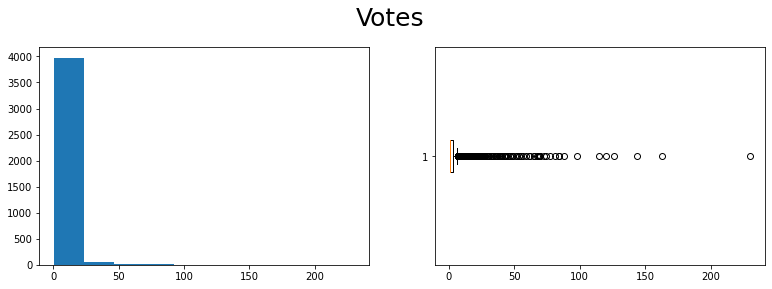

In [21]:
#Votes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,4))
fig.suptitle('Votes', fontsize=25, verticalalignment="center")
ax1.hist(spark_df.toPandas()["votes"])
ax2.boxplot(spark_df.toPandas()["votes"], vert = False)
plt.show()

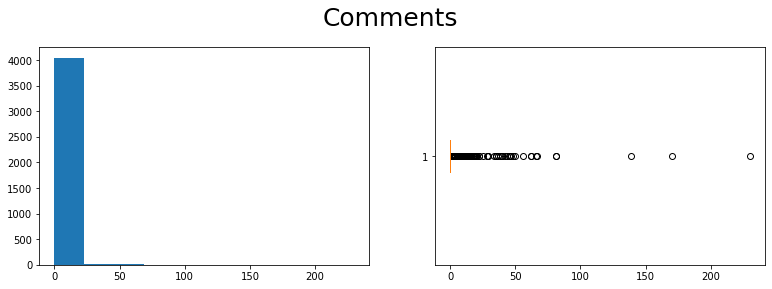

In [22]:
#Comments
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,4))
fig.suptitle('Comments', fontsize=25, verticalalignment="center")
ax1.hist(spark_df.toPandas()["comments"])
ax2.boxplot(spark_df.toPandas()["comments"], vert = False)
plt.show()

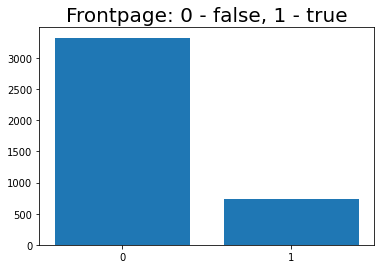

In [23]:
#Frontpage
from matplotlib.ticker import MaxNLocator
plt.bar(spark_df.toPandas()['frontpage'].unique(), spark_df.toPandas()['frontpage'].value_counts(), align = 'center')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.title("Frontpage: 0 - false, 1 - true", fontsize=20)
plt.show()

In [24]:
#Checking for missing values
from pyspark.sql.functions import isnull, when, count, col, isnull
spark_df.select([count(when(isnull(c),c)).alias(c) for c in spark_df.columns]).show()

+---+-----+---+------+-----+----+---------+--------+------------+-----------+---------+
|aid|title|url|domain|votes|user|posted_at|comments|source_title|source_text|frontpage|
+---+-----+---+------+-----+----+---------+--------+------------+-----------+---------+
|  0|    0|  0|     0|    0|   0|        0|       0|         135|         30|        0|
+---+-----+---+------+-----+----+---------+--------+------------+-----------+---------+



In [25]:
#Checking for unique values across categorical variables
#Title
spark_df.select('title').distinct().show(5,truncate=False)
title_c=spark_df.select('title').distinct().count()
print(f"Title has {title_c} unique values.")

+--------------------------------------------------------------------------------+
|title                                                                           |
+--------------------------------------------------------------------------------+
|How to Fund FOSS, Save It from the CRA, and Improve Cybersecurity               |
|Show HN: I replicated Anthropic's monosemanticity research using just my MacBook|
|The Sass project has become unreliable, political and abusive                   |
|AI Sticker Generator – open-source sticker generator for web application        |
|The Metaverse Is Dead                                                           |
+--------------------------------------------------------------------------------+
only showing top 5 rows

Title has 3974 unique values.


In [26]:
#Url
spark_df.select('url').distinct().show(5,truncate=False)
url_c=spark_df.select('url').distinct().count()
print(f"Url has {url_c} unique values.")

+---------------------------------------------------------------------------------------------------------------------------------------------------+
|url                                                                                                                                                |
+---------------------------------------------------------------------------------------------------------------------------------------------------+
|https://www.scmp.com/tech/blockchain/article/3260904/hong-kong-bitcoin-ether-etfs-see-mild-gains-first-day-trading-city-looks-bolster-virtual-asset|
|https://www.doltgres.com/                                                                                                                          |
|https://threlte.xyz/                                                                                                                               |
|https://cruncher.ch/blog/printing-music-with-css-grid/                                             

In [28]:
#Domain
spark_df.select('domain').distinct().show(5,truncate=False)
domain_c=spark_df.select('domain').distinct().count()
print(f"Domain has {domain_c} unique values.")

+-------------------+
|domain             |
+-------------------+
|jamesg.blog        |
|cmu.edu            |
|newbeelearn.com    |
|semiengineering.com|
|nytimes.com        |
+-------------------+
only showing top 5 rows

Domain has 2326 unique values.


In [29]:
#User
spark_df.select('user').distinct().show(5,truncate=False)
user_c=spark_df.select('user').distinct().count()
print(f"User has {user_c} unique values.")

+--------+
|user    |
+--------+
|cebert  |
|layer8  |
|rcarmo  |
|tosh    |
|cpeterso|
+--------+
only showing top 5 rows

User has 2156 unique values.


In [30]:
#Posted-at
spark_df.select('posted_at').distinct().show(5,truncate=False)
posted_at_c=spark_df.select('posted_at').distinct().count()
print(f"Posted_at has {posted_at_c} unique values.")

+-------------------+
|posted_at          |
+-------------------+
|2024-04-29 22:45:45|
|2024-04-29 22:45:25|
|2024-04-28 23:47:44|
|2024-04-29 21:08:42|
|2024-04-30 19:17:44|
+-------------------+
only showing top 5 rows

Posted_at has 4058 unique values.


In [31]:
#Source-title
spark_df.select('source_title').distinct().show(5,truncate=False)
source_title_c=spark_df.select('source_title').distinct().count()
print(f"Source_title has {source_title_c} unique values.")

+-------------------------------------------------------+
|source_title                                           |
+-------------------------------------------------------+
|Rabbit R1 - We Gotta Talk...                           |
|Paper page - LEGENT: Open Platform for Embodied Agents |
|Book: Alice’s Adventures in a differentiable wonderland|
|Just a moment...                                       |
|Running Processes                                      |
+-------------------------------------------------------+
only showing top 5 rows

Source_title has 3329 unique values.


In [32]:
#Checking for unique values across numeric variables
#Votes
votes_d_list=spark_df.select('votes').distinct().sort("votes").collect()
votes_d = [int(row.votes) for row in votes_d_list]
print(votes_d)
votes_c=spark_df.select('votes').distinct().count()
print(f"Votes has {votes_c} unique values.")

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 51, 52, 54, 55, 57, 59, 61, 62, 65, 67, 68, 69, 70, 73, 74, 77, 81, 84, 88, 98, 115, 120, 126, 144, 163, 230]
Votes has 73 unique values.


In [33]:
#Comments
comments_d_list=spark_df.select('comments').distinct().sort("comments").collect()
comments_d = [int(row.comments) for row in comments_d_list]
print(comments_d)
comments_c=spark_df.select('comments').distinct().count()
print(f"Comments has {comments_c} unique values.")

[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 28, 29, 34, 35, 37, 38, 40, 42, 44, 45, 46, 47, 48, 50, 56, 62, 66, 67, 81, 139, 170, 230]
Comments has 45 unique values.


In [ ]:
#Exploring titles (automatic classification, sentiment analysis, or something else)

In [ ]:
#Exploring domains (automatic or manual classification, or something else)

In [ ]:
#Exploring source_text (topic analysis, sentiment analysis or something else)

## 2. Building the model to predict the target ("frontpage") based on the available features

Things to be taken into account:
1) Class imbalance in Y ("frontpage"): "true" values are too few, "false" values are too many.

Possible solutions: undersampling of the majority class, oversampling of the minority class, class weights, other methods...

2) According to the task, it's crucial to use Spark MLlib to train our models.

Out of the 11 initial variables, 5 were left in the final dataset: title, domain, votes, comments and frontpage. The remaining 6 variables (aid, url, user, posted_at, source_title, source_text) were discarded for the following reasons. Aid is a unique identifier per publication. Domain and url convey the same kind of information, yet domain has a more structured form. User represents unique user names and posted_at reflects the exact time of publication, up to seconds. Title and source_title convey the same information, yet title has no None values. Source_text in some cases contains None values too. 

One-hot-encoding was applied to categorical columns and logarithmic transformation was used for numeric ones. The only two numeric features in our dataset (votes and comments) are all heavily positively skewed, therefore applying log-transformation with respect to them contributes to making their distribution more normal.

Initially, the models were built using 2 features only: votes and comments, as it was mentioned in the task that whether an article lands on the frontpage or not largely depends on the user engagement.

(Feel free to change it, if needed)

In [34]:
#Selecting variables for the training dataset
spark_df = spark_df.select("title", "domain", "votes", "comments", "frontpage")
spark_df.show(3)

+--------------------+------------+-----+--------+---------+
|               title|      domain|votes|comments|frontpage|
+--------------------+------------+-----+--------+---------+
|A proof that Unix...|catonmat.net|  2.0|     0.0|      0.0|
|        Pip Boy 3000| youtube.com|  1.0|     0.0|      0.0|
|Recollections of ...|  deramp.com|  1.0|     0.0|      0.0|
+--------------------+------------+-----+--------+---------+
only showing top 3 rows



In [35]:
#Removing outliers or applying some other transformations (if needed)

In [36]:
#Log-transformation, renaming of the target
from pyspark.sql.functions import log
spark_df1 = spark_df.select(spark_df.frontpage.alias('label'), log(spark_df.votes + 1).alias('votes_log'), 
                log(spark_df.comments + 1).alias('comments_log'), spark_df.title, spark_df.domain)

In [37]:
spark_df1.show(3)

+-----+------------------+------------+--------------------+------------+
|label|         votes_log|comments_log|               title|      domain|
+-----+------------------+------------+--------------------+------------+
|  0.0|1.0986122886681096|         0.0|A proof that Unix...|catonmat.net|
|  0.0|0.6931471805599453|         0.0|        Pip Boy 3000| youtube.com|
|  0.0|0.6931471805599453|         0.0|Recollections of ...|  deramp.com|
+-----+------------------+------------+--------------------+------------+
only showing top 3 rows



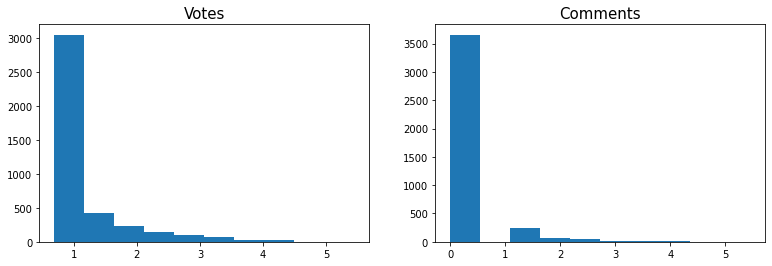

In [38]:
#Votes, Comments (distribution after the log-transformation)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,4))
ax1.hist(spark_df1.toPandas()["votes_log"])
ax1.set_title("Votes", fontsize=15)
ax2.hist(spark_df1.toPandas()["comments_log"])
ax2.set_title("Comments", fontsize=15)
plt.show()

In [39]:
#Preprocessing of the train dataset
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler

#Converting categorical columns to numeric (One-Hot-Encoder approach)
title_1 = StringIndexer(inputCol="title", outputCol="title_n1")
title_2 = OneHotEncoder(dropLast=True, inputCol="title_n1", outputCol="title_n")
domain_1 = StringIndexer(inputCol="domain", outputCol="domain_n1")
domain_2 = OneHotEncoder(dropLast=True, inputCol="domain_n1", outputCol="domain_n")

#VectorAssembler to merge multiple columns into a vector column
assembler = VectorAssembler(inputCols=["votes_log", "comments_log"], outputCol="features")

#Creating the final Pipeline
spark_df_num = Pipeline(stages=[title_1, title_2, domain_1, domain_2, assembler]).fit(spark_df1).transform(spark_df1)

In [40]:
####Creating a custom transformer for renaming the target
#Accoring to this logic:
#renaming = train.withColumnRenamed('frontpage', 'label')


####Creating a custom transformer for the log-transformation with a constant: log(x+1)
#Accoring to this logic:
#votes_log = train.withColumn("votes_log", log(spark_df.votes+1))
#comments_log = train.withColumn("comments_log", log(spark_df.comments+1))


####Creating a new pipeline and adding the two newly created transformers to the Pipeline
#According to this logic:
#spark_df_num = Pipeline(stages=[title_1, title_2, domain_1, domain_2, 
#renaming_transformer, log_transformer, assembler]).fit(spark_df).transform(spark_df)


#If not transformers, these steps need to be integrated into deployment in a different way, 
#but they need to be present there

In [41]:
spark_df_num.show(3)

+-----+------------------+------------+--------------------+------------+--------+-------------------+---------+------------------+--------------------+
|label|         votes_log|comments_log|               title|      domain|title_n1|            title_n|domain_n1|          domain_n|            features|
+-----+------------------+------------+--------------------+------------+--------+-------------------+---------+------------------+--------------------+
|  0.0|1.0986122886681096|         0.0|A proof that Unix...|catonmat.net|   268.0| (3973,[268],[1.0])|    643.0|(2325,[643],[1.0])|[1.09861228866810...|
|  0.0|0.6931471805599453|         0.0|        Pip Boy 3000| youtube.com|  2392.0|(3973,[2392],[1.0])|      0.0|  (2325,[0],[1.0])|[0.69314718055994...|
|  0.0|0.6931471805599453|         0.0|Recollections of ...|  deramp.com|  2550.0|(3973,[2550],[1.0])|    788.0|(2325,[788],[1.0])|[0.69314718055994...|
+-----+------------------+------------+--------------------+------------+--------+

In [42]:
spark_df_num1 = spark_df_num.select(spark_df_num.label, spark_df_num.features)
spark_df_num1.show(5, truncate=False)

+-----+------------------------+
|label|features                |
+-----+------------------------+
|0.0  |[1.0986122886681096,0.0]|
|0.0  |[0.6931471805599453,0.0]|
|0.0  |[0.6931471805599453,0.0]|
|0.0  |[0.6931471805599453,0.0]|
|0.0  |[0.6931471805599453,0.0]|
+-----+------------------------+
only showing top 5 rows



In [43]:
#Performing the train/test split
train, test = spark_df_num1.randomSplit([0.8, 0.2], seed=0)

print(f"Train dataset ({train.count()} observations): frontpage 0 - {train.filter(train.label == 0).count()}, frontpage 1 - {train.filter(train.label == 1).count()}.")
print(f"Test dataset ({test.count()} observations): frontpage 0 - {test.filter(test.label == 0).count()}, frontpage 1 - {test.filter(test.label == 1).count()}.")

Train dataset (3238 observations): frontpage 0 - 2650, frontpage 1 - 588.
Test dataset (835 observations): frontpage 0 - 679, frontpage 1 - 156.


In [44]:
train.show(3)
test.show(3)

+-----+--------------------+
|label|            features|
+-----+--------------------+
|  0.0|[0.69314718055994...|
|  0.0|[0.69314718055994...|
|  0.0|[0.69314718055994...|
+-----+--------------------+
only showing top 3 rows

+-----+--------------------+
|label|            features|
+-----+--------------------+
|  0.0|[0.69314718055994...|
|  0.0|[0.69314718055994...|
|  0.0|[0.69314718055994...|
+-----+--------------------+
only showing top 3 rows



In [45]:
#Building models using spark.ml (MLlib)
from pyspark.ml.classification import LogisticRegression
from pyspark.mllib.evaluation import BinaryClassificationMetrics
from pyspark.mllib.evaluation import MulticlassMetrics

In [46]:
#Logistic regression (frontpage ~ votes_log + comments_log)

#Creating a new logistic regression object for the model
logReg = LogisticRegression(maxIter=10, regParam=0.3, labelCol = 'label', featuresCol="features")

#Training a logistic regression model
lrModel = logReg.fit(train)

In [47]:
#Predicting frontpage (1/0) on the test dataset
predictions = lrModel.transform(test)
predictionAndLabels = predictions.select("label", "prediction").rdd

predictionAndLabels_df = predictionAndLabels.toDF()
predictionAndLabels_df.show()

+-----+----------+
|label|prediction|
+-----+----------+
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
|  0.0|       0.0|
+-----+----------+
only showing top 20 rows



In [49]:
#Evaluation metrics: AUC
metrics = BinaryClassificationMetrics(predictionAndLabels)
print(f"AUC (area under the ROC Curve) = {round(metrics.areaUnderROC,2)}") #0.93

#Evaluation metrics: Confusion matrix
from pyspark.sql import functions as f
metrics = MulticlassMetrics(predictionAndLabels.map(tuple))
#print(metrics.confusionMatrix().toArray())
rows = metrics.confusionMatrix().toArray().tolist()
confusion_matrix = spark.createDataFrame(rows,['col1','col2'])
confusion_matrix = confusion_matrix.select(*[f.round(c).cast('integer').alias(c) for c in confusion_matrix.columns])
confusion_matrix.show()

AUC (area under the ROC Curve) = 0.93
+----+----+
|col1|col2|
+----+----+
| 679| 105|
|   0|  51|
+----+----+



The model is good at capturing "false" frontpage instances (majority class): 679 "false" values were correctly classified as "false", and not a single "false" value was mistakenly classified as "true".

Yet the model fails at predicting "true" instances (minority class): only 51 "true" values were correctly classified as "true", and 105 "true" values were misclassified as "false".

This has to do with the initial class imbalance inherent to our dataset.

In [50]:
#Accuracy
print(f"Accuracy = {round(metrics.accuracy,2)}")

#Precision
print(f"Precision label=0: {round(metrics.precision(label=0),2)}")
print(f"!!! Precision label=1: {round(metrics.precision(label=1),2)} !!!") #0.33

#Recall
print(f"Recall label=0: {round(metrics.recall(label=0),2)}")
print(f"Recall label=1: {round(metrics.recall(label=1),2)}")

#Good at capturing the majority class
#Bad at capturing the minority class

Accuracy = 0.87
Precision label=0: 1.0
!!! Precision label=1: 0.33 !!!
Recall label=0: 0.87
Recall label=1: 1.0


Logistic regression after undersampling of the majority class (label=0).

In [51]:
#Undersampling in Spark

frontpage_no = train.filter("label=0")
frontpage_yes = train.filter("label=1")

#Random sampling of frontpage_no
sampleRatio = frontpage_yes.count() / frontpage_no.count()
frontpage_no_SampleDf = frontpage_no.sample(fraction=sampleRatio, withReplacement=False, seed=0)

print((frontpage_no.count(), len(frontpage_no.columns)))
print((frontpage_yes.count(), len(frontpage_yes.columns)))
print((frontpage_no_SampleDf.count(), len(frontpage_no_SampleDf.columns)))

print(f"Sampling ratio: {round(sampleRatio,2)}")

#Combining the sample of frontpage_no with frontpage_yes
undersampled_train = frontpage_yes.unionAll(frontpage_no_SampleDf)
print((undersampled_train.count(), len(undersampled_train.columns)))

(2650, 2)
(588, 2)
(630, 2)
Sampling ratio: 0.22
(1218, 2)


In [52]:
undersampled_train.show(3,truncate=False)

+-----+------------------------+
|label|features                |
+-----+------------------------+
|1.0  |[1.3862943611198906,0.0]|
|1.0  |[1.3862943611198906,0.0]|
|1.0  |[1.3862943611198906,0.0]|
+-----+------------------------+
only showing top 3 rows



In [53]:
#Logistic regression after undersampling (frontpage ~ votes_log + comments_log)
lrModel_u = logReg.fit(undersampled_train)

#Predicting frontpage (1/0) on the test dataset
predictions_u = lrModel_u.transform(test)
predictionAndLabels_u = predictions_u.select("prediction", "label").rdd

predictionAndLabels_df_u = predictionAndLabels_u.toDF()
predictionAndLabels_df_u.show()

+----------+-----+
|prediction|label|
+----------+-----+
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
+----------+-----+
only showing top 20 rows



In [54]:
#Evaluation metrics: AUC
metrics_u = BinaryClassificationMetrics(predictionAndLabels_u)
print(f"AUC (area under the ROC Curve) = {round(metrics_u.areaUnderROC,2)}") #0.87

#Evaluation metrics: Confusion matrix
metrics_u = MulticlassMetrics(predictionAndLabels_u.map(tuple))
#print(metrics.confusionMatrix().toArray())
rows_u = metrics_u.confusionMatrix().toArray().tolist()
confusion_matrix_u = spark.createDataFrame(rows_u,['col1','col2'])
confusion_matrix_u = confusion_matrix_u.select(*[f.round(c).cast('integer').alias(c) for c in confusion_matrix_u.columns])
confusion_matrix_u.show()

AUC (area under the ROC Curve) = 0.87
+----+----+
|col1|col2|
+----+----+
| 660|  19|
|  35| 121|
+----+----+



After undersampling, the logistic regression substantially improved its predictive quality with respect to the minority class, while also slightly deteriorating it with respect to the majority class. Namely, 660 "false" values were correctly classified as "false", while 19 "false" values got misclassified as "true". When it comes to the positive label, 121 "true" values were correctly classified as "true", and only 35 "true" values were misclassified as "false". Hence, undersampling solved to a large degree the problem of class imbalance that was observed in the very beginning.

In [56]:
#Accuracy
print(f"Accuracy = {round(metrics_u.accuracy,2)}")

#Precision
print(f"Precision label=0: {round(metrics_u.precision(label=0),2)}")
print(f"!!! Precision label=1: {round(metrics_u.precision(label=1),2)} !!!") #0.86

#Recall
print(f"Recall label=0: {round(metrics_u.recall(label=0),2)}")
print(f"Recall label=1: {round(metrics_u.recall(label=1),2)}")

#Good at capturing the majority class
#Bad at capturing the minority class

Accuracy = 0.94
Precision label=0: 0.95
!!! Precision label=1: 0.86 !!!
Recall label=0: 0.97
Recall label=1: 0.78


In [57]:
#Model selection (hyperparameter tuning) based on K-fold cross-validation for logistic regression

from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator

lr = LogisticRegression()
grid = ParamGridBuilder().addGrid(lr.maxIter, [0, 100]).build()
#evaluator = BinaryClassificationEvaluator()
evaluator = MulticlassClassificationEvaluator()

cv = CrossValidator(estimator=lr, estimatorParamMaps=grid, 
                    evaluator=evaluator.setMetricName("weightedPrecision"), 
                    numFolds = 5, seed = 0,
                    parallelism=2)
cvModel = cv.fit(undersampled_train)

#Possible options for setMetricName=(f1|accuracy|weightedPrecision|weightedRecall|weightedTruePositiveRate| 
#weightedFalsePositiveRate|weightedFMeasure|truePositiveRateByLabel| 
#falsePositiveRateByLabel|precisionByLabel|recallByLabel|fMeasureByLabel|logLoss|hammingLoss)

In [58]:
#Making predictions on test data using the best model found by CrossValidator()
predictions_cv = cvModel.transform(test)
predictionAndLabels_cv = predictions_cv.select("prediction", "label").rdd

predictionAndLabels_df_cv = predictionAndLabels_cv.toDF()
predictionAndLabels_df_cv.show(100)

+----------+-----+
|prediction|label|
+----------+-----+
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|  0.0|
|       0.0|

In [59]:
#Evaluation metrics: AUC
metrics_cv = BinaryClassificationMetrics(predictionAndLabels_cv)
print(f"AUC (area under the ROC Curve) = {round(metrics_cv.areaUnderROC,2)}") #0.97

#Evaluation metrics: Confusion matrix
metrics_cv = MulticlassMetrics(predictionAndLabels_cv.map(tuple))
#print(metrics.confusionMatrix().toArray())
rows_cv = metrics_cv.confusionMatrix().toArray().tolist()
confusion_matrix_cv = spark.createDataFrame(rows_cv,['col1','col2'])
confusion_matrix_cv = confusion_matrix_cv.select(*[f.round(c).cast('integer').alias(c) for c in confusion_matrix_cv.columns])
confusion_matrix_cv.show()

AUC (area under the ROC Curve) = 0.97
+----+----+
|col1|col2|
+----+----+
| 634|  45|
|   0| 156|
+----+----+



The model is now perfectly able to capture all 156 instances of the minority class, which proves that undersampling coupled with log-transformation is able to solve the problem of class imbalace.

In [63]:
#Accuracy
print(f"Accuracy = {round(metrics_cv.accuracy,2)}")

#Precision
print(f"Precision label=0: {round(metrics_cv.precision(label=0),2)}")
print(f"!!! Precision label=1: {round(metrics_cv.precision(label=1),2)} !!!") #0.78

#Recall
print(f"Recall label=0: {round(metrics_cv.recall(label=0),2)}")
print(f"Recall label=1: {round(metrics_cv.recall(label=1),2)}")

#Good at capturing both the majority and the minority class

Accuracy = 0.95
Precision label=0: 1.0
!!! Precision label=1: 0.78 !!!
Recall label=0: 0.93
Recall label=1: 1.0


## 3. Using the trained model to make predictions as the stream comes in

I.e. show that we can connect to the data source, preprocess/featurize incoming messages, have our model predict the label, and show it, similar to spark_streaming_example_predicting.ipynb.

In [64]:
import random
from pyspark.streaming import StreamingContext
from pyspark.sql import Row
from pyspark.sql.functions import udf, struct, array, col, lit
from pyspark.sql.types import StringType

In [150]:
#spark_streaming_example_predicting.ipynb

globals()['models_loaded'] = False
globals()['my_model'] = None

# Toy predict function that returns a random probability. Normally you'd use your loaded globals()['my_model'] here
def predict(df):
    return random.random()

predict_udf = udf(predict, StringType())

def process(time, rdd):
    if rdd.isEmpty():
        return
    
    print("========= %s =========" % str(time))
    
    # Convert to data frame
    df = spark.read.json(rdd)
    df.show()
    
    # Utilize our predict function
    df_withpreds = df.withColumn("pred", predict_udf(
        struct([df[x] for x in df.columns])
    ))
    df_withpreds.show()
    
    # Normally, you wouldn't use a UDF (User Defined Function) Python function to predict as we did here (you can)
    # but an MLlib model you've built and saved with Spark
    # In this case, you need to prevent loading your model in every call to "process" as follows:
    
    # Load in the model if not yet loaded:
    if not globals()['models_loaded']:
        # load in your models here
        globals()['my_model'] = '***' # Replace '***' with e.g.:    [...].load('my_logistic_regression')
        globals()['models_loaded'] = True
        
    # And then predict using the loaded model (uncomment below):
    
    # df_result = globals()['my_model'].transform(df)
    # df_result.show()

In [151]:
ssc = StreamingContext(sc, 10)

C:\Users\HP\Downloads\spark\spark\spark-3.5.1-bin-hadoop3\python\pyspark\streaming\context.py:72: FutureWarning: DStream is deprecated as of Spark 3.4.0. Migrate to Structured Streaming.
  warnings.warn(


In [152]:
lines = ssc.socketTextStream("seppe.net", 7778)
lines.foreachRDD(process)

In [153]:
ssc_t = StreamingThread(ssc)
ssc_t.start()

========= 2024-05-07 00:24:10 =========
+--------+--------+------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------+-----+
|     aid|comments|      domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|  user|votes|
+--------+--------+------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------+-----+
|40272784|       0|  thegums.co|    false|2024-05-06 09:29:43|Gum API - Native,...|Gum API - Native,...|Show HN: Lightwei...|https://thegums.c...|docuru|    1|
|40272791|       0|france24.com|     true|2024-05-06 09:31:29|‘Gateway to Hell’...|‘Gateway to Hell’...|Gateway to Hell':...|https://www.franc...|  wslh|    3|
+--------+--------+------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+------+-----+


In [154]:
ssc_t.stop()

----- Stopping... this may take a few seconds -----
+--------+--------+-----------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|     aid|comments|           domain|frontpage|          posted_at|         source_text|        source_title|               title|                 url|      user|votes|
+--------+--------+-----------------+---------+-------------------+--------------------+--------------------+--------------------+--------------------+----------+-----+
|40272805|       0|           kle.io|    false|2024-05-06 09:34:16|Kleio · Blazingly...|Kleio · Blazingly...|Show HN: Kleio – ...|      https://kle.io|    probst|    1|
|40272855|       0|      youtube.com|    false|2024-05-06 09:41:38|Donald Knuth - Wr...|Donald Knuth - Wr...|Donald Knuth – Wr...|https://www.youtu...|   lulzury|    2|
|40272860|       0|lecturesbureau.gr|    false|2024-05-06 09:42:53|Lectures Bureau |...|Living in the A

In [ ]:
#Predicting based on our model

In [65]:
#Saving the model
import tempfile

path = tempfile.mkdtemp()
model_path = path + "/model"
cvModel.write().save(model_path)

In [68]:
globals()['models_loaded'] = False
globals()['my_model'] = None

#Loading in the model if not yet loaded:
if not globals()['models_loaded']:
    # load in your models here
    globals()['my_model'] = globals().load('model_path')
    globals()['models_loaded'] = True


def predict(df):
    df1 = spark_df.select(spark_df.frontpage.alias('label'), log(spark_df.votes + 1).alias('votes_log'), 
                log(spark_df.comments + 1).alias('comments_log'))
    df_num1 = Pipeline(stages=[title_1, title_2, domain_1, domain_2, assembler]).fit(df1).transform(df1)
    return globals()['my_model'].transform(df_num1)

predict_udf = udf(predict, StringType())

def process(time, rdd):
    if rdd.isEmpty():
        return
    
    print("========= %s =========" % str(time))
    
    # Convert to data frame
    df = spark.read.json(rdd)
    df.show()
    
    # Utilize our predict function
    df_withpreds = df.withColumn("pred", predict_udf(
        struct([df[x] for x in df.columns])
    ))
    df_withpreds.show()

AttributeError: 'dict' object has no attribute 'read'

In [ ]:
#Replace it by Spark Structured Streaming (the way it's used in the very beginning of the code)

ssc = StreamingContext(sc, 10)

lines = ssc.socketTextStream("seppe.net", 7778)
lines.foreachRDD(process)

ssc_t = StreamingThread(ssc)
ssc_t.start()

ssc_t.stop()

In [ ]:
#Checking the quality of our predictions

## Conclusion